## Setup Environment

In [1]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [3]:
!nvidia-smi

Fri Oct 26 10:08:41 2018       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 384.130                Driver Version: 384.130                   |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  GeForce GTX 108...  Off  | 00000000:01:00.0  On |                  N/A |
|  0%   58C    P2    60W / 250W |   1205MiB / 11164MiB |      1%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

GPU is fired up and ready to go.

In [2]:
import os.path as osp
import openslide
from pathlib import Path

## Load data

In [3]:
import os.path as osp
import openslide
from pathlib import Path

#BASE_TRUTH_DIR = '/home/wli/Downloads/CAMELYON16/masking'

slide_path = '/home/wli/Downloads/googlepred/tumor_026.tif'
#truth_path = osp.join(BASE_TRUTH_DIR, 'tumor_009_mask.tif')

slide = openslide.open_slide(slide_path)
#truth = openslide.open_slide(truth_path)

"Original Slide dimensions %dx%d" % slide.dimensions
#"Original Truth dimensions %dx%d" % truth.dimensions

'Original Slide dimensions 97280x220672'

In [123]:
slide.level_dimensions

((97280, 220672),
 (48640, 110592),
 (24576, 55296),
 (12288, 27648),
 (6144, 13824),
 (3072, 7168),
 (1536, 3584),
 (1024, 2048),
 (512, 1024),
 (512, 512))

In [17]:
slide.level_downsamples

(1.0,
 1.9976851851851851,
 3.974537037037037,
 7.949074074074074,
 15.898148148148149,
 31.226190476190474,
 62.45238095238095,
 101.375,
 202.75,
 310.5)

In [18]:
slide.properties

<_PropertyMap {'openslide.level[2].downsample': '3.9745370370370372', 'openslide.level[8].width': '512', 'openslide.level[2].height': '55296', 'openslide.level[4].downsample': '15.898148148148149', 'openslide.quickhash-1': 'ba53c9cf185a02982e1bd320d4e6e21e55906fc61d56a9da526b628f0c593889', 'openslide.level[8].height': '1024', 'openslide.level[4].width': '6144', 'openslide.level[5].tile-height': '512', 'openslide.level[5].height': '7168', 'openslide.level[6].height': '3584', 'openslide.level[0].tile-width': '512', 'openslide.level[7].downsample': '101.375', 'openslide.level[3].width': '12288', 'openslide.level[2].width': '24576', 'tiff.ImageDescription': '<?xml version="1.0" encoding="UTF-8" ?>\n<DataObject ObjectType="DPUfsImport">\n\t<Attribute Name="DICOM_MANUFACTURER" Group="0x0008" Element="0x0070" PMSVR="IString">3D Histech</Attribute>\n\t<Attribute Name="PIM_DP_SCANNED_IMAGES" Group="0x301D" Element="0x1003" PMSVR="IDataObjectArray">\n\t\t<Array>\n\t\t\t<DataObject ObjectType="DP

In [4]:
from openslide.deepzoom import DeepZoomGenerator


In [5]:
tiles = DeepZoomGenerator(slide, tile_size=224, overlap=0, limit_bounds=False)


In [118]:
tiles.level_count

19

In [119]:
tiles.tile_count

572460

In [120]:
tiles.level_dimensions

((1, 1),
 (1, 2),
 (2, 4),
 (3, 7),
 (6, 14),
 (12, 27),
 (24, 54),
 (48, 108),
 (95, 216),
 (190, 431),
 (380, 862),
 (760, 1724),
 (1520, 3448),
 (3040, 6896),
 (6080, 13792),
 (12160, 27584),
 (24320, 55168),
 (48640, 110336),
 (97280, 220672))

In [124]:
tiles.level_tiles

((1, 1),
 (1, 1),
 (1, 1),
 (1, 1),
 (1, 1),
 (1, 1),
 (1, 1),
 (1, 1),
 (1, 1),
 (1, 2),
 (2, 4),
 (4, 8),
 (7, 16),
 (14, 31),
 (28, 62),
 (55, 124),
 (109, 247),
 (218, 493),
 (435, 986))

In [127]:
slide.dimensions[0]/224

434.2857142857143

In [9]:
 imgg17 = tiles.get_tile(18, (250, 550))

In [6]:
plt.imshow(imgg17)

NameError: name 'imgg17' is not defined

In [101]:
 imgg16 = tiles.get_tile(16, (63, 137))

In [11]:
imgg17=np.array(imgg17)

In [12]:
imgg17.shape

(224, 224, 3)

In [107]:
 imgg0 = tiles.get_tile(0, (0, 0))

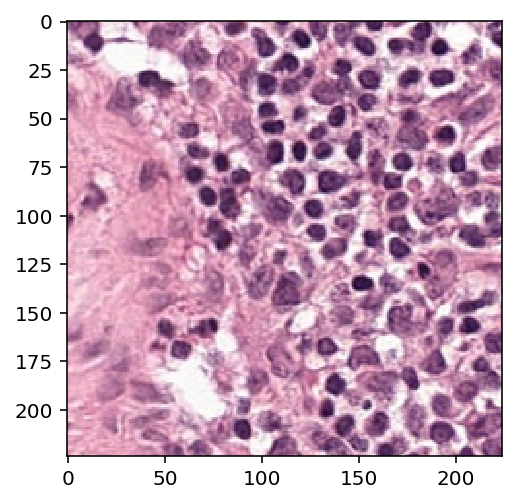

In [89]:
plt.imshow(imgg)


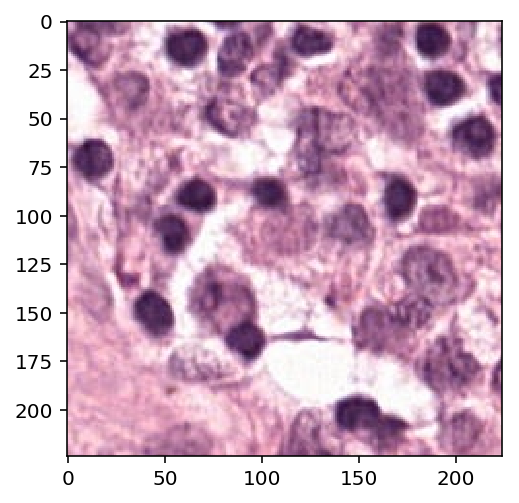

In [95]:
plt.imshow(imgg18)

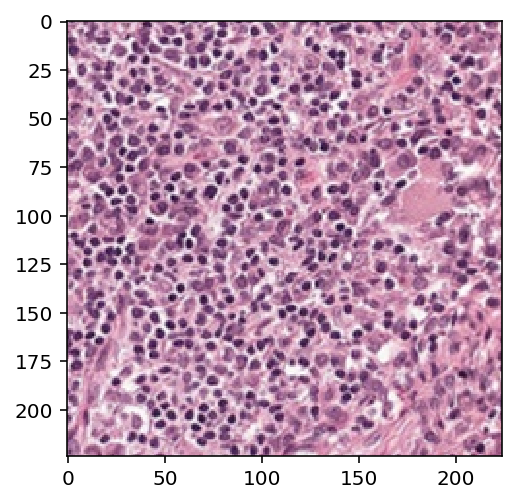

In [102]:
plt.imshow(imgg16)

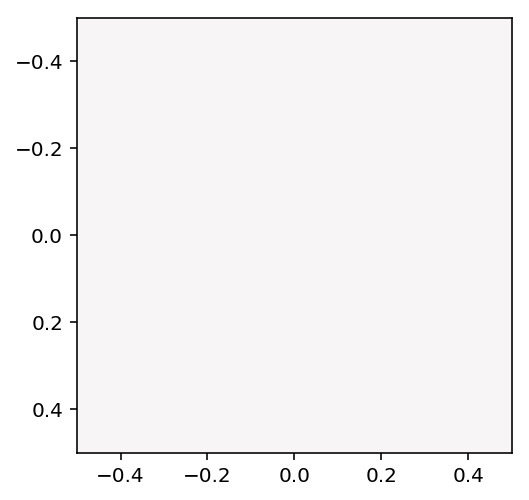

In [104]:
plt.imshow(imgg0)

In [68]:
f = np.array(imgg)

In [5]:
m = slide.read_region((56000, 123200), 0, (672, 672))

In [48]:
noise = np.random.uniform(0, 10, size=(1,1,3))

In [49]:
noise.astype('uint8')

array([[[3, 9, 1]]], dtype=uint8)

In [13]:
m.type()

AttributeError: 'Image' object has no attribute 'type'

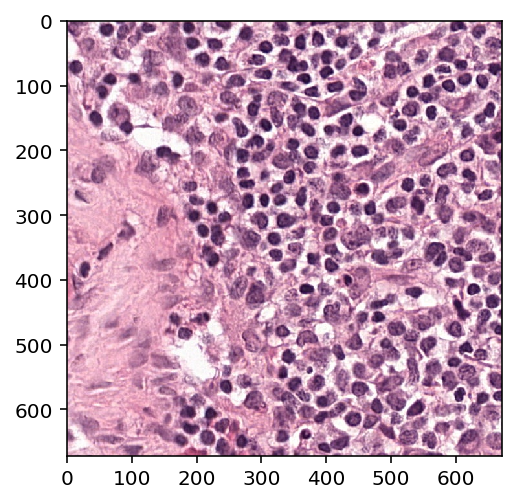

In [6]:
plt.imshow(m)

In [7]:
m = np.array(m)

In [8]:
m = m[:,:,:3]

In [24]:
m_colornoise = m + np.random.uniform(0, 20, size=(1,3))

In [52]:
m_integ = m_colornoise.astype('uint8')

In [16]:
import cv2

In [17]:
m_hsv = cv2.cvtColor(m, cv2.COLOR_BGR2HSV)

In [27]:
m_hsv_colornoise = m_hsv + np.random.uniform(0, 20, size=(1,3))

In [28]:
m_hsv_colornoise_integ = m_hsv_colornoise.astype('uint8')

In [76]:
m_rgb = cv2.cvtColor(m_hsv_colornoise_integ, cv2.COLOR_HSV2BGR)-10
#m_rgb = m_rgb.astype('uint8')

In [79]:
m_rgb.max()


254

In [51]:
new_m_rgb.reshape(224, 224).max()

AttributeError: 'list' object has no attribute 'reshape'

In [58]:
new_m_rgb = m_rgb - 10

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


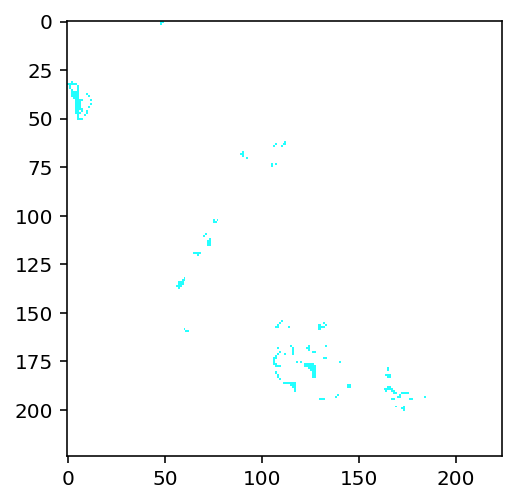

In [63]:
plt.imshow(m_hsv_colornoise)

In [60]:
m_integ[1,:,:]

array([[230, 176, 210],
       [232, 175, 211],
       [221, 166, 204],
       [195, 140, 178],
       [158, 105, 142],
       [129,  76, 113],
       [113,  61, 100],
       [108,  59,  97],
       [123,  75, 115],
       [114,  69, 108],
       [109,  64, 103],
       [111,  63, 103],
       [114,  64, 105],
       [117,  67, 110],
       [126,  73, 117],
       [134,  81, 125],
       [138,  88, 131],
       [131,  81, 124],
       [128,  78, 121],
       [132,  79, 123],
       [131,  78, 122],
       [125,  73, 114],
       [127,  73, 115],
       [133,  81, 120],
       [150,  97, 134],
       [158, 105, 139],
       [167, 115, 146],
       [172, 119, 146],
       [178, 122, 149],
       [185, 128, 153],
       [191, 131, 157],
       [193, 131, 158],
       [200, 138, 165],
       [231, 171, 199],
       [241, 185, 212],
       [231, 178, 204],
       [228, 179, 201],
       [227, 178, 198],
       [232, 183, 203],
       [244, 198, 214],
       [252, 204, 218],
       [241, 198

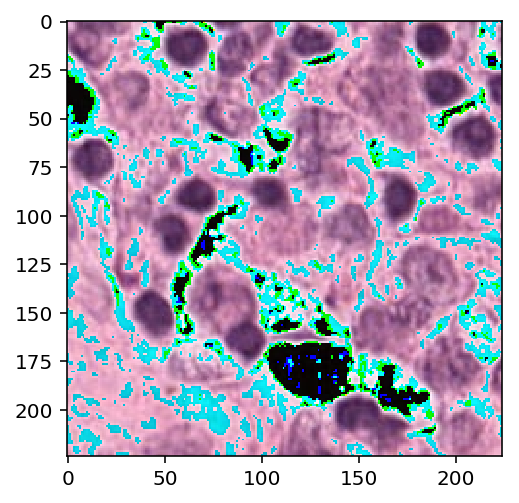

In [25]:
plt.imshow(m_colornoise.astype('uint8'))

Text(0.5,1,'before adding color noise')

Text(0.5,1,'after adding color noise on RGB image patch')

Text(0.5,1,'after adding color noise on HSV image patch')

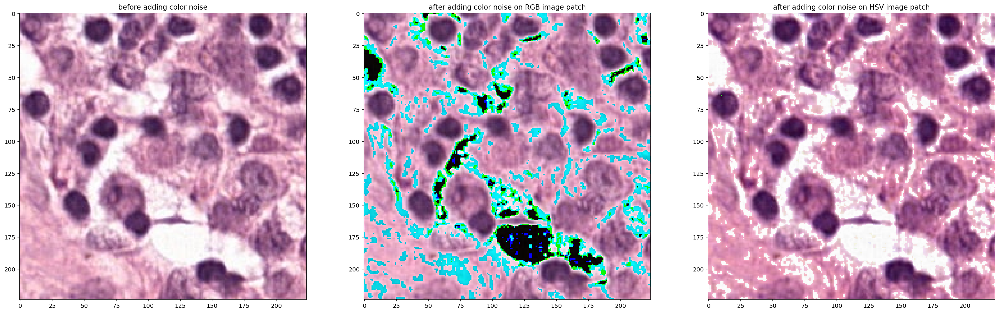

In [77]:
f, axes = plt.subplots(1, 3, figsize=(30, 10));
ax = axes.ravel()
ax[0].imshow(m);
ax[0].set_title('before adding color noise')
ax[1].imshow(m_colornoise.astype('uint8'));
ax[1].set_title('after adding color noise on RGB image patch')
ax[2].imshow(m_rgb)
ax[2].set_title('after adding color noise on HSV image patch')
#f.suptitle('a');

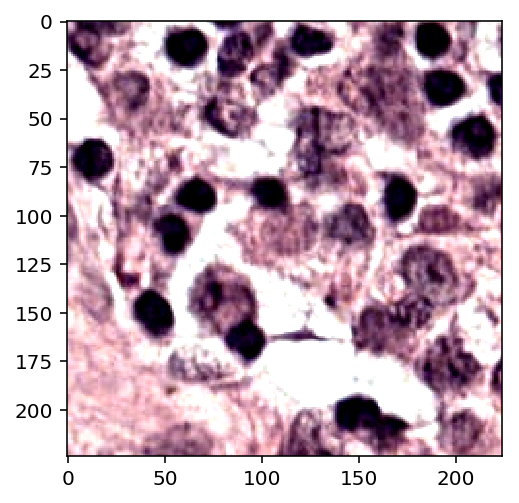

In [88]:
import tensorflow as tf
import matplotlib.pyplot as plt

def color_perturbation(image):
      
      image = tf.image.random_brightness(image, max_delta=64./ 255.)
      image = tf.image.random_saturation(image, lower=0.75, upper=1.25)
      image = tf.image.random_hue(image, max_delta=0.04)
      image = tf.image.random_contrast(image, lower=0.25, upper=1.75)
      
      
      
      
      return image


image_color_perturb = color_perturbation(m)

init = tf.initialize_all_variables()
sess = tf.Session()
sess.run(init)
im = sess.run(image_color_perturb)
plt.imshow(im)


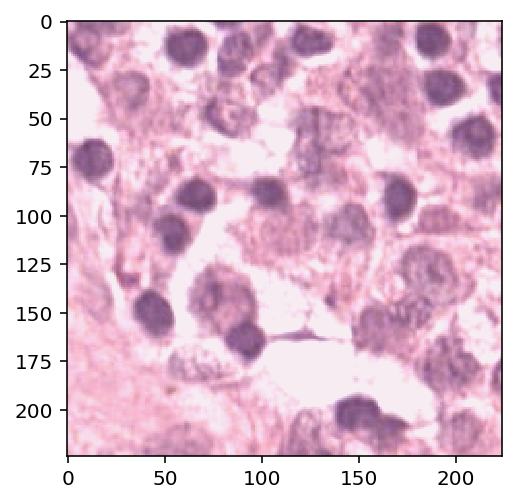

In [86]:
plt.imshow(im)

In [80]:
plt.imsave('m.png', m)
plt.imsave('f.png', f)


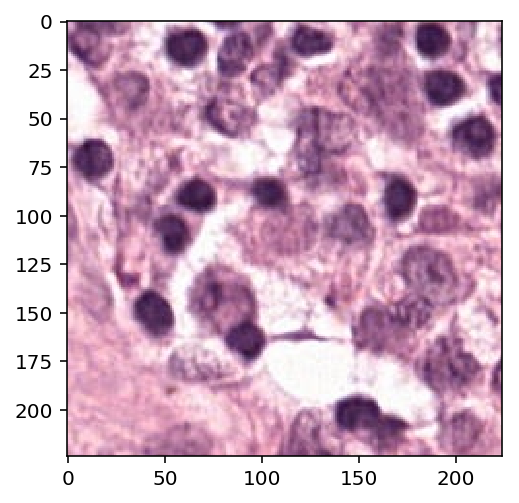

In [79]:
plt.imshow()

In [107]:
predheatmap = np.load('outputheatmap_tumor_001.npy')
len(predheatmap)

80040

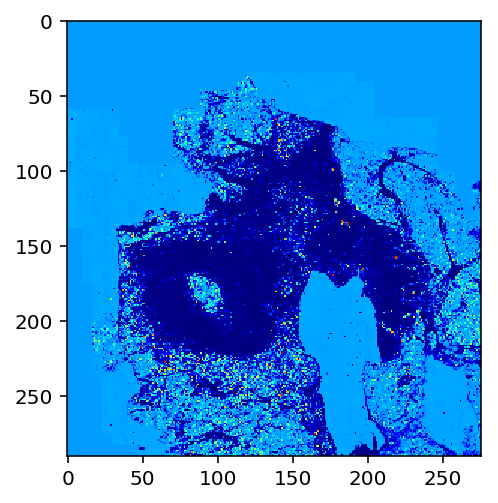

In [108]:
predreshape = predheatmap.reshape(290, 276)
plt.imshow(predreshape, cmap = 'jet')

In [5]:
pred = np.load('101616tumor_026.npy')

In [4]:
preddim = np.load('1016dimensions_tumor_026.npy')

In [8]:
preddim

array([985, 434,   3,  42, 421, 376, 927, 552, 380])

In [6]:
len(pred)

209760

In [7]:
predheatmap = pred.reshape(preddim[7], preddim[8])

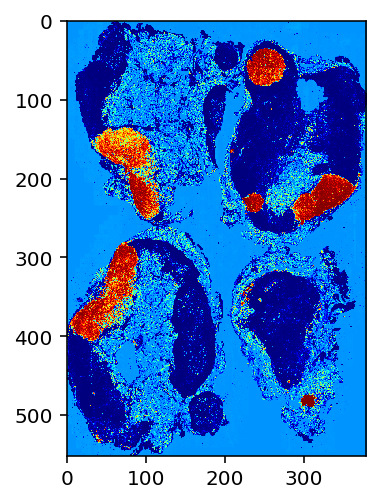

In [9]:
plt.imshow(predheatmap, cmap = 'jet')

In [45]:
import seaborn as sns

In [ ]:
newtumor_26pred = np.load('newtumor_026.npy')
sns.heatmap(newtumor_26pred, annot=True)

In [35]:
heatmap_final_final = np.zeros((pred[0], pred[1]), predreshape.dtype)

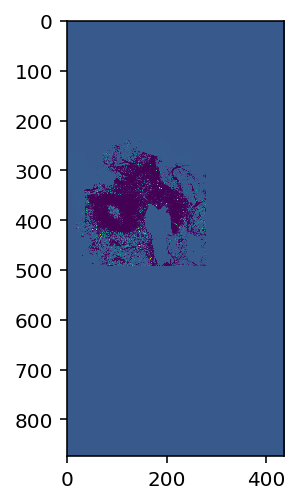

In [37]:


heatmap_final_final[:]=0.2722071

heatmap_final_final[pred[5]-1:pred[6], pred[3]-1:pred[4]] = predreshape
plt.imshow(heatmap_final_final)


In [186]:
len(pred)

3596

In [13]:
tumor079 = np.load('outputheatmap_tumor_079.npy')
len(tumor079)

160308

In [88]:
tumor079dim = np.load('dimensions_tumor_026.npy')
print(tumor079dim)

[868 434   3  32 313 279 686 408 282]


In [ ]:
newlarge =  slide.read_region((0, 0), )

In [38]:
import numpy as np
import matplotlib.pyplot as plt
import glob
import os.path as osp

pred_dim_dir = '/home/wli/Downloads/pred/dimensions/'
#pred_dim_dir = '/home/wli/Documents/predtest/dimension/'
pred_dim_paths = glob.glob(osp.join(pred_dim_dir, '*.npy'))
pred_dim_paths.sort()

pred_rawheatmap_dir = '/home/wli/Downloads/pred/rawheatmap/'
#pred_rawheatmap_dir = '/home/wli/Documents/predtest/rawheatmap/'
pred_rawheatmap_paths = glob.glob(osp.join(pred_rawheatmap_dir, '*.npy'))
pred_rawheatmap_paths.sort()

for i in range(len(pred_dim_paths)):
    pred_dim = np.load(pred_dim_paths[i])
    pred_heatmap = np.load(pred_rawheatmap_paths[i])
    
    if pred_dim[7]*pred_dim[8] == len(pred_heatmap)*32:
        heatmap_final = pred_heatmap.reshape(pred_dim[7], pred_dim[8])
        
    else:
        
        heatmap_new = pred_heatmap[:pred_dim[7]*pred_dim[8]]
        heatmap_final = heatmap_new.reshape(pred_dim[7], pred_dim[8])
        
        
    heatmap_final_final = np.zeros((pred_dim[0], pred_dim[1]), heatmap_final.dtype)

    heatmap_final_final[:]=0.2722071

    heatmap_final_final[pred_dim[5]-1:pred_dim[6], pred_dim[3]-1:pred_dim[4]] = heatmap_final

np.save('/home/wli/Downloads/pred/realheatmap_bbox/%s' % (osp.splitext(osp.basename(pred_dim_paths[i]))[0]), heatmap_final)
np.save('/home/wli/Downloads/pred/realheatmap/%s' % (osp.splitext(osp.basename(pred_dim_paths[i]))[0]), heatmap_final_final)


ValueError: could not broadcast input array from shape (292,549) into shape (292,0)

In [173]:
prednew.extend([5, 8])

In [174]:
prednew

[3, 9, 5, 8]

In [165]:
for i in range(1, len(pred)+1):
    prednew.extend(pred[:1])

In [180]:
np.array(pred[:1])

array([array([[0.72547984, 0.27452016],
       [0.7268896 , 0.27311036],
       [0.72362876, 0.2763712 ],
       [0.7365834 , 0.26341656],
       [0.7519477 , 0.24805234],
       [0.8019073 , 0.19809268],
       [0.7252002 , 0.2747998 ],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
       [0.7277926 , 0.27220738],
   

In [185]:
pred[:1].shape

(1,)

In [152]:
prednew

[1, 2, 3, 9]

AttributeError: 'NoneType' object has no attribute 'extend'

These slides are huge -- 21 billion pixels!  We'll break this huge image into 256x256x3 patches for training.

NameError: name 'predheatmap' is not defined

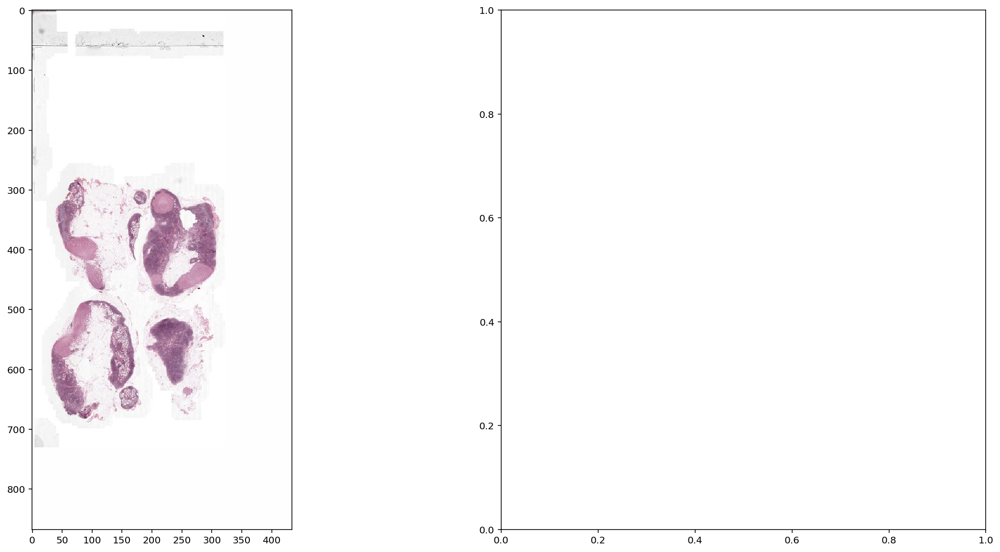

In [93]:
thumbnail = slide.get_thumbnail((slide.dimensions[0] / 224, slide.dimensions[1] / 224))
#thumbnail_truth = truth.get_thumbnail((truth.dimensions[0] / 256, truth.dimensions[1] / 256)) 

f, axes = plt.subplots(1, 2, figsize=(20, 10));
ax = axes.ravel()
ax[0].imshow(thumbnail_5);
#ax[0].set_title('Slide %dx%d' % thumbnail.size)
ax[1].imshow(predheatmap);
#ax[1].set_title('Truth %dx%d' % thumbnail_truth.size)
f.suptitle('Slide & Truth Thumbnails (downsampled 256x)');

ValueError: Colormap grey is not recognized. Possible values are: Accent, Accent_r, Blues, Blues_r, BrBG, BrBG_r, BuGn, BuGn_r, BuPu, BuPu_r, CMRmap, CMRmap_r, Dark2, Dark2_r, GnBu, GnBu_r, Greens, Greens_r, Greys, Greys_r, OrRd, OrRd_r, Oranges, Oranges_r, PRGn, PRGn_r, Paired, Paired_r, Pastel1, Pastel1_r, Pastel2, Pastel2_r, PiYG, PiYG_r, PuBu, PuBuGn, PuBuGn_r, PuBu_r, PuOr, PuOr_r, PuRd, PuRd_r, Purples, Purples_r, RdBu, RdBu_r, RdGy, RdGy_r, RdPu, RdPu_r, RdYlBu, RdYlBu_r, RdYlGn, RdYlGn_r, Reds, Reds_r, Set1, Set1_r, Set2, Set2_r, Set3, Set3_r, Spectral, Spectral_r, Wistia, Wistia_r, YlGn, YlGnBu, YlGnBu_r, YlGn_r, YlOrBr, YlOrBr_r, YlOrRd, YlOrRd_r, afmhot, afmhot_r, autumn, autumn_r, binary, binary_r, bone, bone_r, brg, brg_r, bwr, bwr_r, cividis, cividis_r, cool, cool_r, coolwarm, coolwarm_r, copper, copper_r, cubehelix, cubehelix_r, flag, flag_r, gist_earth, gist_earth_r, gist_gray, gist_gray_r, gist_heat, gist_heat_r, gist_ncar, gist_ncar_r, gist_rainbow, gist_rainbow_r, gist_stern, gist_stern_r, gist_yarg, gist_yarg_r, gnuplot, gnuplot2, gnuplot2_r, gnuplot_r, gray, gray_r, hot, hot_r, hsv, hsv_r, inferno, inferno_r, jet, jet_r, magma, magma_r, nipy_spectral, nipy_spectral_r, ocean, ocean_r, pink, pink_r, plasma, plasma_r, prism, prism_r, rainbow, rainbow_r, seismic, seismic_r, spring, spring_r, summer, summer_r, tab10, tab10_r, tab20, tab20_r, tab20b, tab20b_r, tab20c, tab20c_r, terrain, terrain_r, viridis, viridis_r, winter, winter_r

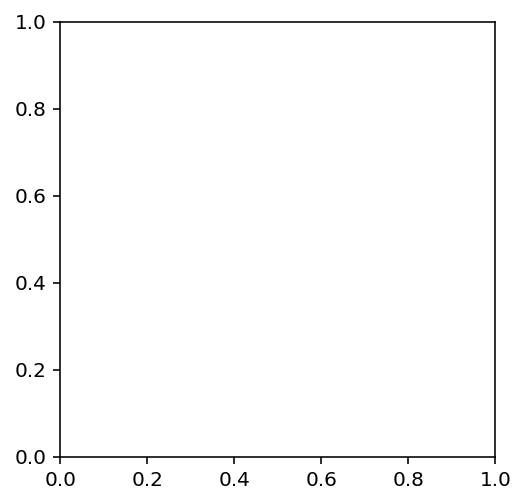

In [41]:
newmake = np.load('newtumor_026.npy')
plt.imshow(newmake, cmap = 'grey')

In [138]:
            samplesnew = pd.DataFrame(pd.DataFrame(np.array(thumbnail.convert('L'))))
            #print(samplesnew)
            # very critical: y value is for row, x is for column

            samplesforpred = samplesnew.loc[279:686, 32:313]
            #samplesforpred2 = samplesforpred*224
            dsample = samplesforpred.shape
            print(samplesforpred)
            

            #dimensions.extend(dsample)

            #np.save ('/home/wli/Documents/predtest/dimensions_%s' % (osp.splitext(osp.basename(slide_paths[i]))[0]), dimensions)

            #print(samplesforpred)
            
            samplesforpredfinal = pd.DataFrame(samplesforpred.stack())

            print(samplesforpredfinal)

            samplesforpredfinal['tile_loc'] = list(samplesforpredfinal.index)



            samplesforpredfinal.reset_index(inplace=True, drop=True)


            samplesforpredfinal['slide_path'] = '/Document'


            print(samplesforpredfinal)

     32   33   34   35   36   37   38   39   40   41  ...   304  305  306  \
279  255  255  255  255  255  255  255  255  255  254 ...   255  255  255   
280  255  255  255  255  255  255  255  255  255  254 ...   255  255  255   
281  255  255  255  255  255  255  255  255  255  254 ...   255  255  255   
282  255  255  255  255  255  255  255  255  255  254 ...   255  255  255   
283  255  255  255  255  255  255  255  255  255  254 ...   255  255  255   
284  255  255  255  255  255  255  255  255  255  254 ...   255  255  255   
285  255  255  255  255  255  255  255  255  255  255 ...   255  254  254   
286  255  255  255  255  255  255  255  255  255  255 ...   254  254  254   
287  255  255  255  255  255  255  255  255  255  254 ...   255  255  255   
288  255  255  255  255  255  255  255  255  255  254 ...   254  254  254   
289  255  255  255  255  255  255  255  255  255  254 ...   255  255  255   
290  255  255  255  255  255  255  255  255  255  254 ...   253  253  253   

In [109]:
newraw = np.load('/home/wli/Documents/predtest/rawheatmap/outputheatmap_tumor_026.npy')

In [110]:
newrawdim = np.load('/home/wli/Documents/predtest/dimension/dimensions_tumor_026.npy')

In [111]:
len(newraw)

115056

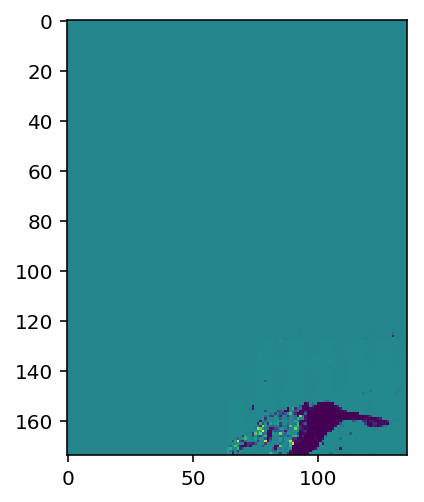

In [140]:
tumor_005 = np.load('dimensions_tumor_005.npy')
plt.imshow(tumor_005)

In [142]:
newrawdim = np.load('/home/wli/dimensions_tumor_026.npy')
newrawdim

array([868, 434,   3,  32, 313, 279, 686, 408, 282])

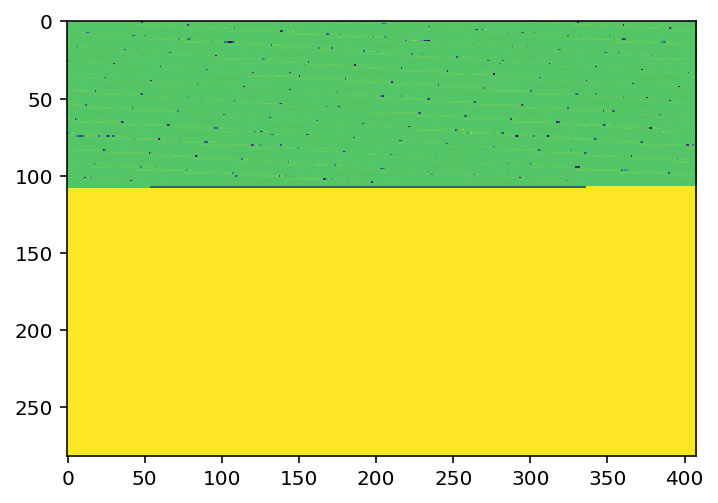

In [130]:
newrawreshape = newraw.reshape(282, 408)
plt.imshow(newrawreshape)


In [15]:
newrawdim

array([868, 434,   3,  32, 313, 279, 686, 408, 282])

In [115]:
slide.dimensions[0]/224

434.2857142857143

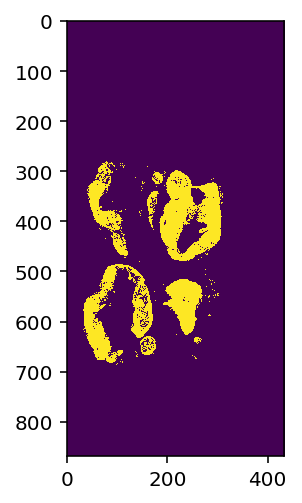

In [40]:
from skimage.filters import threshold_otsu
import cv2 as cv2

thum = np.array(thumbnail)
hsv_image = cv2.cvtColor(thum, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv_image)
hthresh = threshold_otsu(h)
sthresh = threshold_otsu(s)
vthresh = threshold_otsu(v)
        # be min value for v can be changed later
minhsv = np.array([hthresh, sthresh, 0], np.uint8)
maxhsv = np.array([180, 255, vthresh], np.uint8)
thresh = [minhsv, maxhsv]
        #extraction the countor for tissue

rgbbinary = cv2.inRange(hsv_image, thresh[0], thresh[1])
plt.imshow(rgbbinary)


In [16]:
 _, contours, _ = cv2.findContours(rgbbinary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
bboxtcols = ['xmin', 'xmax', 'ymin', 'ymax']
bboxt = pd.DataFrame(columns=bboxtcols)
for c in contours:
    (x, y, w, h) = cv2.boundingRect(c)
    bboxt = bboxt.append(pd.Series([x, x+w, y, y+h], index = bboxtcols), ignore_index=True)
    bboxt = pd.DataFrame(bboxt)
            
xxmin = list(bboxt['xmin'].get_values())
xxmax = list(bboxt['xmax'].get_values())
yymin = list(bboxt['ymin'].get_values())
yymax = list(bboxt['ymax'].get_values())

xxxmin = np.min(xxmin)
xxxmax = np.max(xxmax)
yyymin = np.min(yymin)
yyymax = np.max(yymax)

dcoord = (xxxmin, xxxmax, yyymin, yyymax)

print(dcoord)
        

(32, 313, 279, 686)


In [42]:
samplesnewbinary = pd.DataFrame(pd.DataFrame(np.array(rgbbinary)))

In [12]:
thumbnail = slide.get_thumbnail((slide.dimensions[0] / 224, slide.dimensions[1] / 224))

In [14]:
thumbnail = np.array(thumbnail)


In [15]:
thumbnailnew = thumbnail[376:927, 42:421, :]

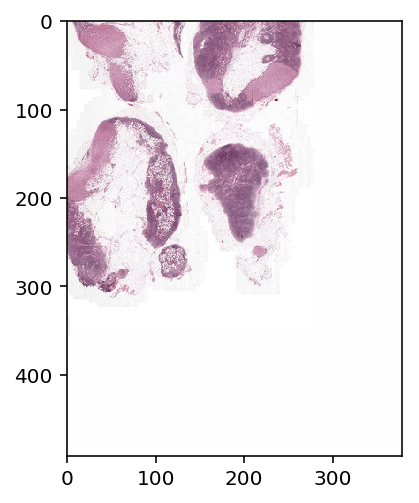

In [16]:
plt.imshow(thumbnailnew)

In [26]:
newregion = slide.read_region((9408, 84224), 0, (18512, 20976))

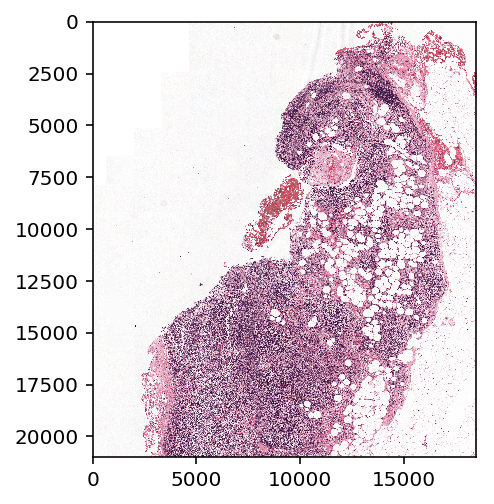

In [27]:
plt.imshow(newregion)

In [46]:
samplesforpredbinary = samplesnewbinary.loc[yyymin:yyymax, xxxmin:xxxmax]

In [19]:
bbox = [32, 313, 279, 686]

In [21]:
bboxlarge = [x * 224 for x in bbox]
bboxlarge


[7168, 70112, 62496, 153664]

In [ ]:
7704, 75017, 66704, 164024

ymax: 203193, ymin: 82519, xmax: 92712

In [ ]:
62944, 91168


97280x220672

In [85]:
newlarge = slide.read_region((75017, 164024), 0, (6295, 9117))

In [87]:
slide.PROPERTY_NAME_BOUNDS_X

AttributeError: 'OpenSlide' object has no attribute 'PROPERTY_NAME_BOUNDS_X'

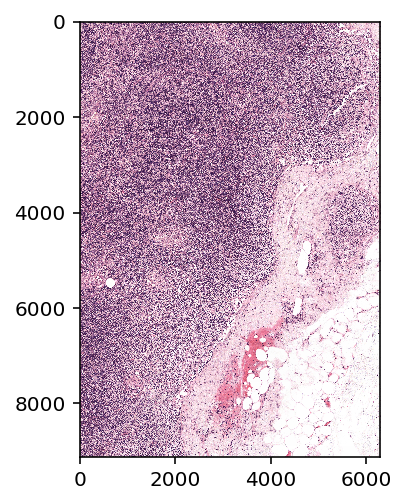

In [86]:
plt.imshow(newlarge)

In [69]:
tiles = DeepZoomGenerator(slide, tile_size=224, overlap=0, limit_bounds=False)
#print(batch_sample.tile_loc[::], batch_sample.tile_loc[::-1])
img = tiles.get_tile(tiles.level_count-1, samplesforpredbinary.tile_loc[::-1])


TypeError: unorderable types: tuple() < int()

In [87]:
for i in range(32, 313):
 img = tiles.get_tile(tiles.level_count-1, (34, 282))
 plt.imsave('img_%d.png' %(i), img)

In [65]:
samplesforpredfinal = pd.DataFrame(samplesforpred.stack())

            #print(samplesforpredfinal)

samplesforpredfinal['tile_loc'] = list(samplesforpredfinal.index)

samplesforpredfinal.reset_index(inplace=True, drop=True)


samplesforpredfinal['slide_path'] = slide_path


print(samplesforpredfinal)


          0    tile_loc                                    slide_path
0       255   (279, 32)  /home/wli/Downloads/googlepred/tumor_026.tif
1       255   (279, 33)  /home/wli/Downloads/googlepred/tumor_026.tif
2       255   (279, 34)  /home/wli/Downloads/googlepred/tumor_026.tif
3       255   (279, 35)  /home/wli/Downloads/googlepred/tumor_026.tif
4       255   (279, 36)  /home/wli/Downloads/googlepred/tumor_026.tif
5       255   (279, 37)  /home/wli/Downloads/googlepred/tumor_026.tif
6       255   (279, 38)  /home/wli/Downloads/googlepred/tumor_026.tif
7       255   (279, 39)  /home/wli/Downloads/googlepred/tumor_026.tif
8       255   (279, 40)  /home/wli/Downloads/googlepred/tumor_026.tif
9       254   (279, 41)  /home/wli/Downloads/googlepred/tumor_026.tif
10      254   (279, 42)  /home/wli/Downloads/googlepred/tumor_026.tif
11      255   (279, 43)  /home/wli/Downloads/googlepred/tumor_026.tif
12      253   (279, 44)  /home/wli/Downloads/googlepred/tumor_026.tif
13      255   (279, 

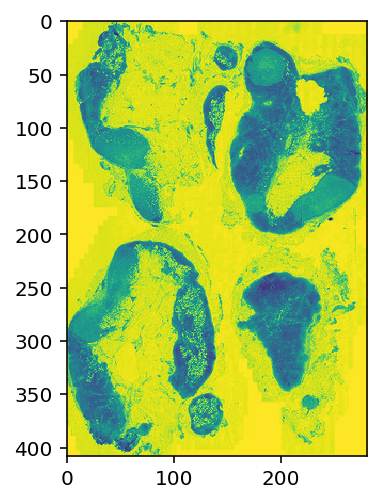

In [21]:
plt.imshow(samplesforpredbinary)

In [25]:
b,g,r = cv2.split(thum)

In [35]:
thumbnail.shape

NameError: name 'thumbnail' is not defined

In [34]:
slide.level_dimensions

((97280, 220672),
 (48640, 110592),
 (24576, 55296),
 (12288, 27648),
 (6144, 13824),
 (3072, 7168),
 (1536, 3584),
 (1024, 2048),
 (512, 1024),
 (512, 512))

In [36]:
slide.level_downsamples

(1.0,
 1.9976851851851851,
 3.974537037037037,
 7.949074074074074,
 15.898148148148149,
 31.226190476190474,
 62.45238095238095,
 101.375,
 202.75,
 310.5)

In [94]:
thumbnail_5 = slide.read_region((0, 0), 5, slide.level_dimensions[5])


In [99]:
thumbnail_6 = slide.read_region((0, 0), 6, slide.level_dimensions[6])

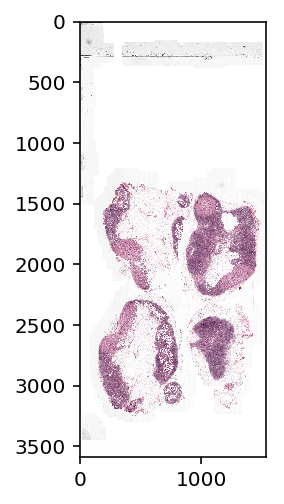

In [101]:
plt.imshow(thumbnail_6)

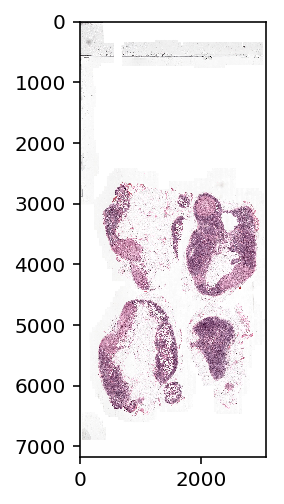

In [95]:
plt.imshow(thumbnail_5)

[array([68, 34, 70], dtype=uint8), array([180, 255, 210], dtype=uint8)]


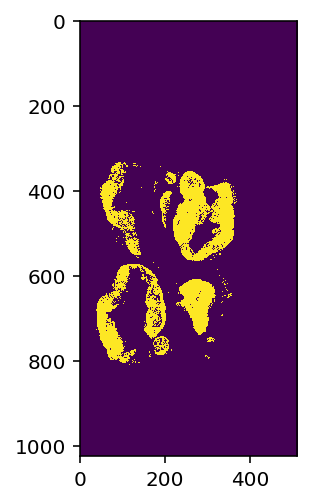

In [77]:
from skimage.filters import threshold_otsu
import cv2 as cv2

thum = np.array(thumbnail)
hsv_image = cv2.cvtColor(thum, cv2.COLOR_BGR2HSV)
h, s, v = cv2.split(hsv_image)
hthresh = threshold_otsu(h)
sthresh = threshold_otsu(s)
vthresh = threshold_otsu(v)
        # be min value for v can be changed later
minhsv = np.array([hthresh, sthresh, 70], np.uint8)
maxhsv = np.array([180, 255, vthresh], np.uint8)
thresh = [minhsv, maxhsv]
print(thresh)
        #extraction the countor for tissue

rgbbinary = cv2.inRange(hsv_image, thresh[0], thresh[1])
plt.imshow(rgbbinary)


In [96]:
thum.shape

NameError: name 'thum' is not defined

In [65]:
thresh[0]

array([69, 35, 70], dtype=uint8)

In [78]:
 _, contours, _ = cv2.findContours(rgbbinary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
bboxtcols = ['xmin', 'xmax', 'ymin', 'ymax']
bboxt = pd.DataFrame(columns=bboxtcols)
for c in contours:
    (x, y, w, h) = cv2.boundingRect(c)
    bboxt = bboxt.append(pd.Series([x, x+w, y, y+h], index = bboxtcols), ignore_index=True)
    bboxt = pd.DataFrame(bboxt)
            
xxmin = list(bboxt['xmin'].get_values())
xxmax = list(bboxt['xmax'].get_values())
yymin = list(bboxt['ymin'].get_values())
yymax = list(bboxt['ymax'].get_values())

xxxmin = np.min(xxmin)
xxxmax = np.max(xxmax)
yyymin = np.min(yymin)
yyymax = np.max(yymax)

dcoord = (xxxmin, xxxmax, yyymin, yyymax)

print(dcoord)
        

(38, 370, 329, 809)


In [69]:
xxmin.sort()

In [70]:
xxmin

[146,
 148,
 148,
 149,
 151,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 152,
 153,
 153,
 154,
 154,
 155,
 155,
 155,
 155,
 156,
 156,
 156,
 156,
 156,
 156,
 156,
 156,
 156,
 156,
 157,
 157,
 157,
 157,
 158,
 158,
 158,
 158,
 158,
 158,
 159,
 159,
 159,
 160,
 160,
 160,
 162,
 162,
 162,
 163,
 163,
 165,
 165,
 165,
 165,
 165,
 165,
 166,
 166,
 167,
 167,
 169,
 169,
 170,
 170,
 170,
 171,
 171,
 172,
 173,
 174,
 174,
 175,
 175,
 176,
 176,
 176,
 176,
 177,
 177,
 177,
 178,
 179,
 179,
 180,
 180,
 181,
 181,
 184,
 184,
 184,
 185,
 185,
 186,
 187,
 187,
 187,
 187,
 188,
 188,
 188,
 189,
 189,
 189,
 190,
 190,
 190,
 190,
 190,
 190,
 191,
 191,
 192,
 192,
 192,
 192,
 192,
 193,
 193,
 193,
 193,
 193,
 194,
 194,
 194,
 195,
 196,
 196,
 196,
 196,
 196,
 197,
 198,
 198,
 198,
 198,
 198,
 199,
 199,
 199,
 200,
 201,
 201,
 201,
 202,
 202,
 202,
 202,
 202,
 203,
 203,
 204,
 207,
 208,
 209,
 211,
 212,
 213,
 213,
 216,
 217,
 217,
 217,
 218

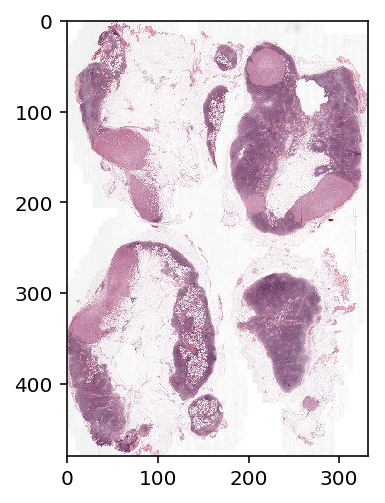

In [79]:
cropped = thum[329:809, 38:370]
plt.imshow(cropped)

In [81]:
bbox_large = [x*slide.level_downsamples[8] for x in dcoord]

In [82]:
bbox_large

[7704.5, 75017.5, 66704.75, 164024.75]

In [83]:
bbox_large = [int(x) for x in bbox_large]
bbox_large

[7704, 75017, 66704, 164024]

In [57]:
import math
bbox_large = [math.floor[bbox_large[i]] for i in range(4)]
bbox_large

TypeError: 'builtin_function_or_method' object is not subscriptable

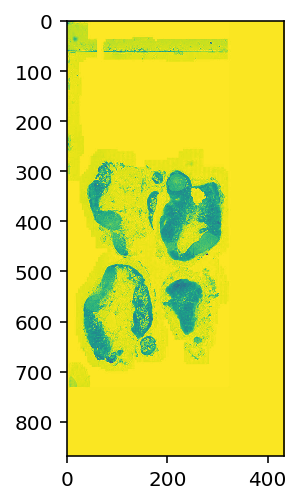

In [28]:
plt.imshow(r)

In [29]:
bnew = pd.DataFrame(pd.DataFrame(np.array(b)))
gnew = pd.DataFrame(pd.DataFrame(np.array(g)))
rnew = pd.DataFrame(pd.DataFrame(np.array(r)))
bpred = bnew.loc[yyymin:yyymax, xxxmin:xxxmax]
gpred = gnew.loc[yyymin:yyymax, xxxmin:xxxmax]
rpred = rnew.loc[yyymin:yyymax, xxxmin:xxxmax]

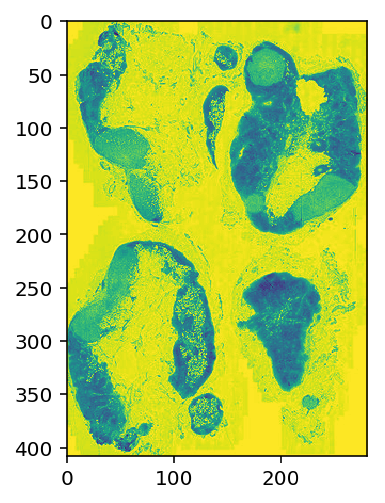

In [35]:
plt.imshow(bpred)

In [36]:
bpred.shape

(408, 282)

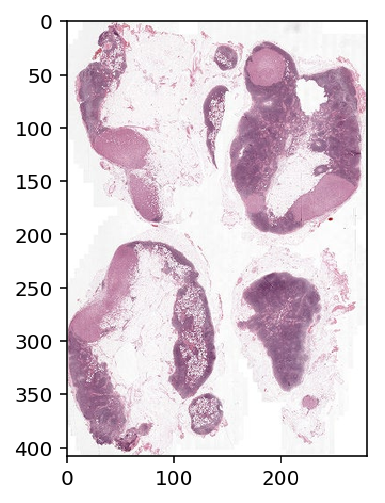

In [37]:
newimage = cv2.merge((np.array(bpred), np.array(gpred), np.array(rpred)))
plt.imshow(newimage)

In [50]:
dim = np.load('dimensions_tumor_026.npy')
print(dim)

[868 434   3  32 313 279 686 408 282]


In [63]:
rawheatmap = np.load('outputheatmap_tumor_026.npy')
len(rawheatmap)

115056

In [61]:
rawheatmap

array([0.27452016, 0.27311036, 0.2763712 , ..., 0.23445128, 0.298986  ,
       0.31539884], dtype=float32)

In [62]:
heatmap_new

array([0.27452016, 0.27311036, 0.2763712 , ..., 0.23445128, 0.298986  ,
       0.31539884], dtype=float32)

NameError: name 'pred_dim' is not defined

In [55]:
heatmap_new = rawheatmap[:dim[7]*dim[8]]
len(heatmap_new)


115056

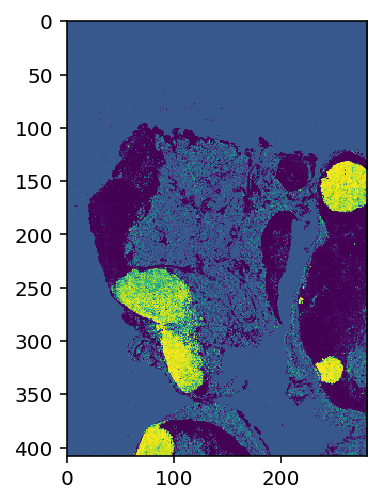

In [64]:
heatmapraw = rawheatmap.reshape(dim[7], dim[8])
plt.imshow(heatmapraw)

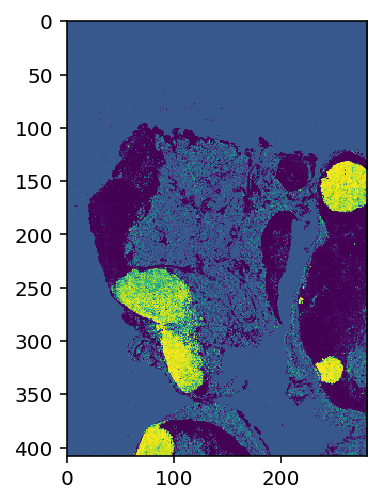

In [60]:
heatmap_final = heatmap_new.reshape(dim[7], dim[8])
plt.imshow(heatmap_final)

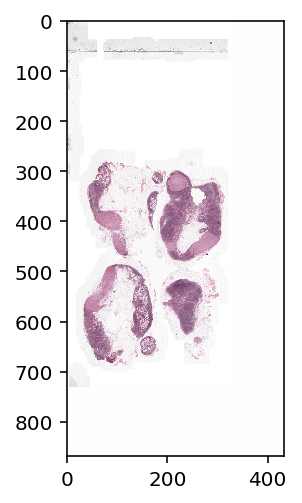

In [66]:
plt.imshow(thumbnail)

In [119]:
test_001 = np.load('test_001.npy')


<Figure size 720x720 with 0 Axes>

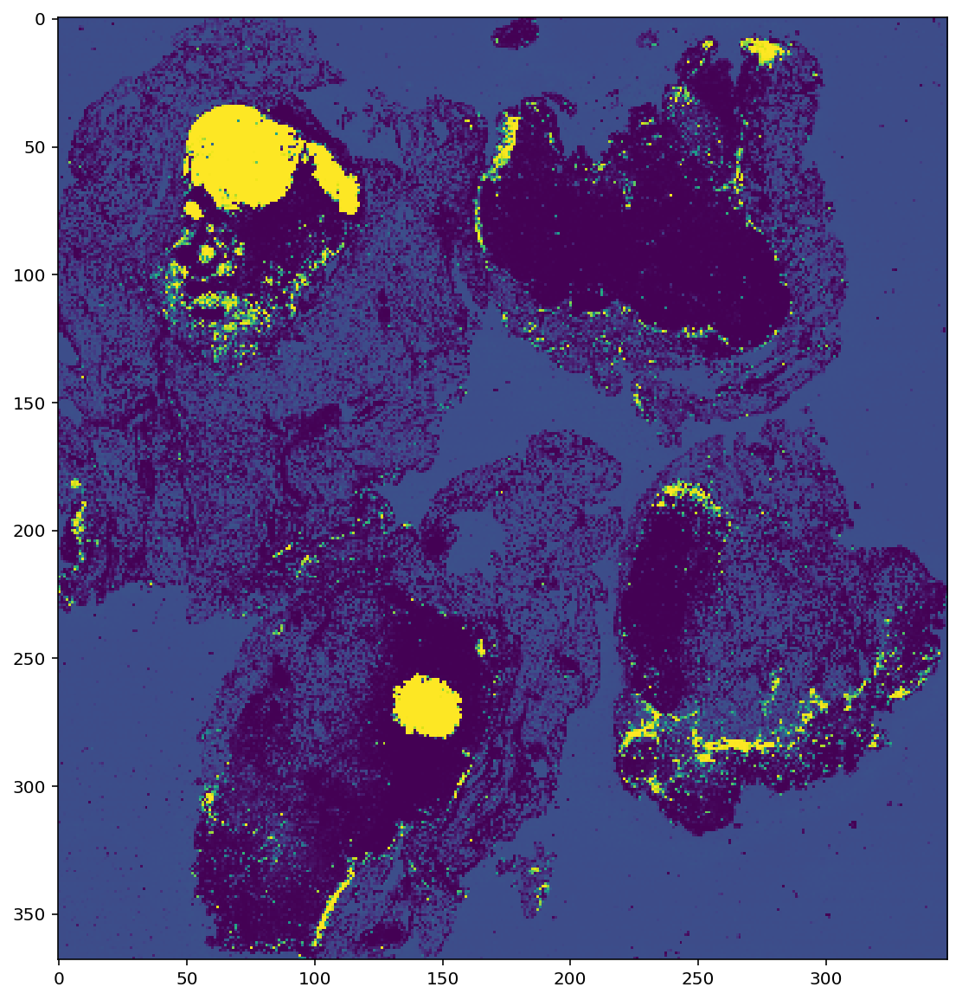

In [145]:
plt.figure(figsize=(10,10))
plt.imshow(test_001)

In [121]:
test_002 = np.load('test_002_raw_heatmap.npy')
test_002_dim = np.load('test_002.npy')

In [122]:
test_002_dim

array([987, 436,   3,  48, 405, 292, 841, 550, 358])

In [134]:
test_002_strech=test_002.reshape(141900, 1)


ValueError: cannot reshape array of size 6154 into shape (141900,1)

In [137]:
newlist = []
for i in range(test_002.shape[0]):
    newlist.extend(test_002[i])
    
    i=i+1
    


In [139]:
len(newlist)

196900

In [142]:
realheatmap = np.array(newlist).reshape(550, 358)

<Figure size 720x720 with 0 Axes>

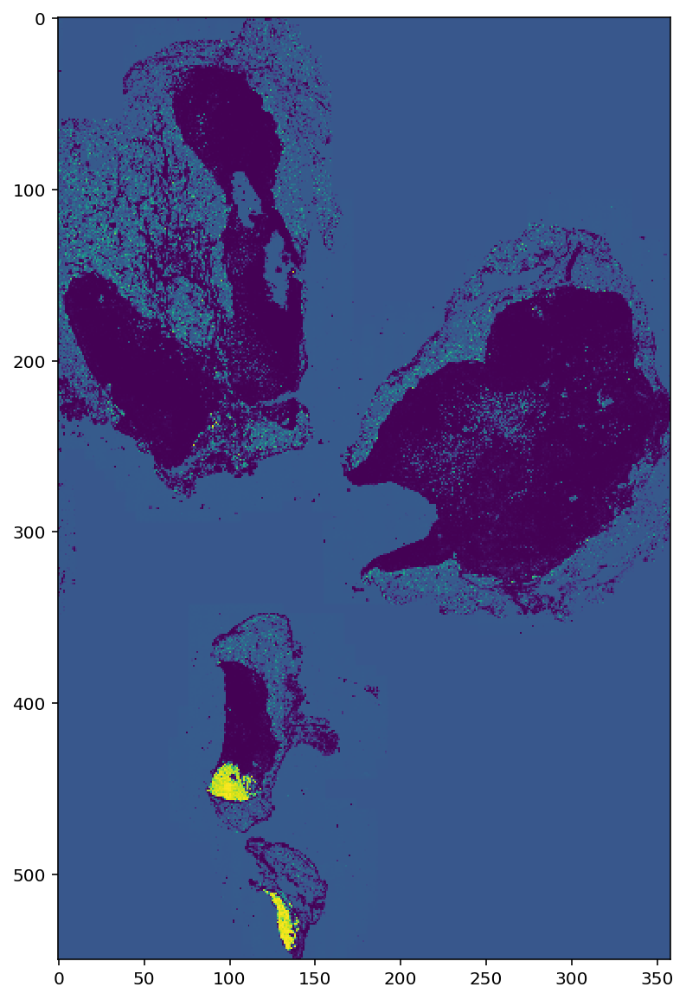

In [144]:
plt.figure(figsize=(10,10))
plt.imshow(realheatmap)

In [124]:
test_001_rawheatmap = np.load('test_001.npy')

In [150]:
test_019_realheatmap = np.load('test_018.npy')

In [155]:
dim_normal_104 = np.load('normal_104_dimentions.npy')
dim_normal_104

array([480, 603,   3,  32, 602,  21, 438, 418, 571])

In [156]:
raw_heatmap_normal_104 = np.load('normal_104_rawheatmap.npy')

In [157]:
raw_heatmap_normal_104.shape

(5079,)

In [158]:
newlist_normal104 = []
for i in range(raw_heatmap_normal_104.shape[0]):
    newlist_normal104.extend(raw_heatmap_normal_104[i])
    
    i=i+1

In [160]:
np.array(newlist_normal104).shape

(162498,)

In [161]:
realheatmap_102 = np.load('normal_102.npy')

<Figure size 720x720 with 0 Axes>

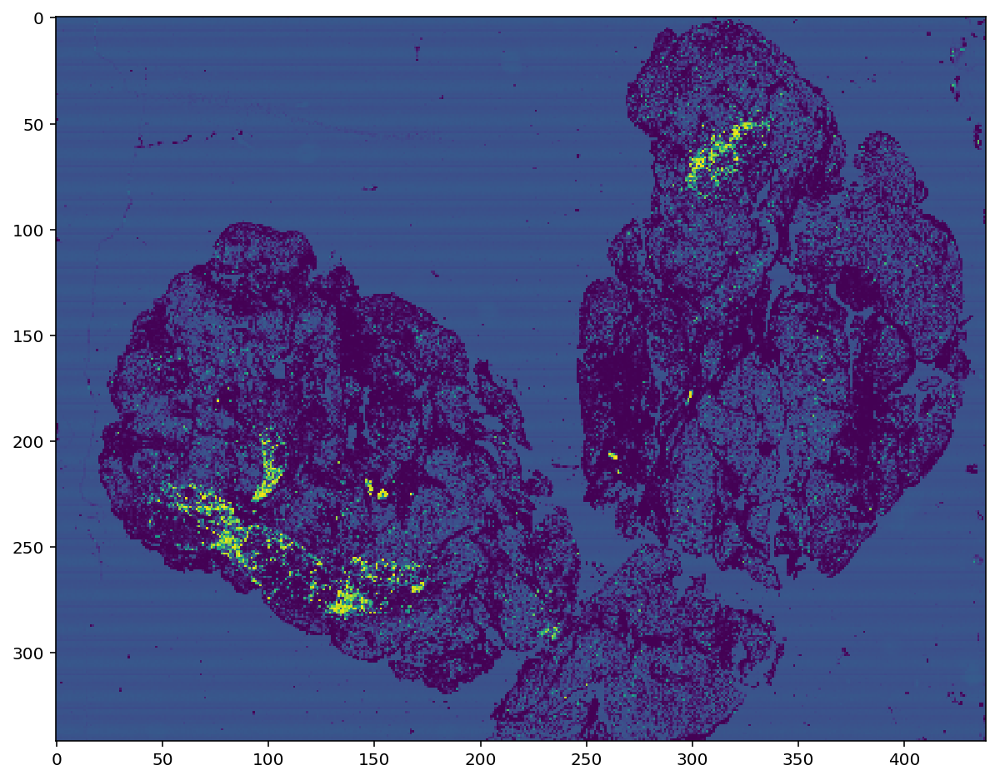

In [163]:
plt.figure(figsize=(10,10))
plt.imshow(realheatmap_102)

<Figure size 720x720 with 0 Axes>

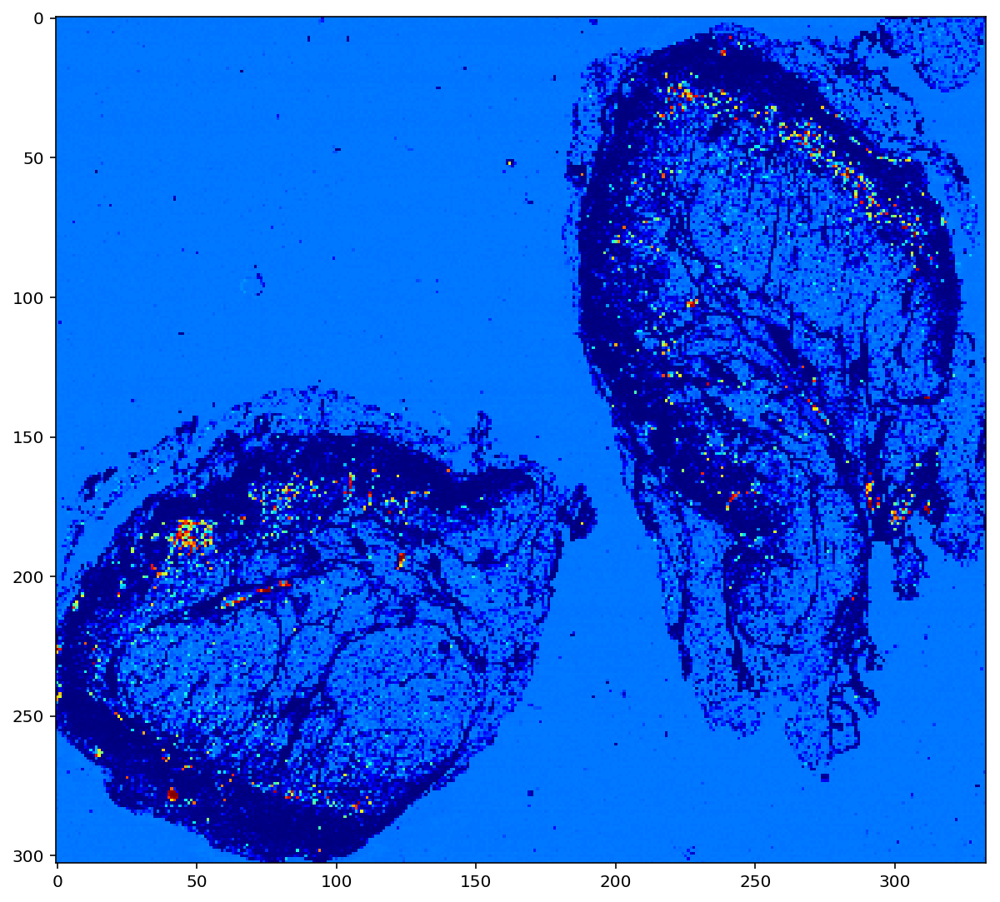

In [178]:
plt.figure(figsize=(10,10))


plt.imshow(test_019_realheatmap, cmap = 'jet')


In [129]:
test_001_rawheatmap

array([[0.23240195, 0.24249777, 0.23504548, ..., 0.23739016, 0.23589835,
        0.23343438],
       [0.23502846, 0.23339534, 0.23728843, ..., 0.13444631, 0.09321407,
        0.23086672],
       [0.16477188, 0.21165778, 0.23474276, ..., 0.23319243, 0.23335983,
        0.23411854],
       ...,
       [0.23574443, 0.23690754, 0.23498447, ..., 0.23881508, 0.2395693 ,
        0.241931  ],
       [0.23552734, 0.23303856, 0.23732804, ..., 0.23417653, 0.23582238,
        0.23316331],
       [0.2357983 , 0.2329046 , 0.23414429, ..., 0.23282051, 0.23411483,
        0.23209651]], dtype=float32)

In [30]:
combined[:,:,0] = bpred
combined[:,:,1] = gpred
combined[:,:,2] = rpred

NameError: name 'combined' is not defined

<Figure size 720x720 with 0 Axes>

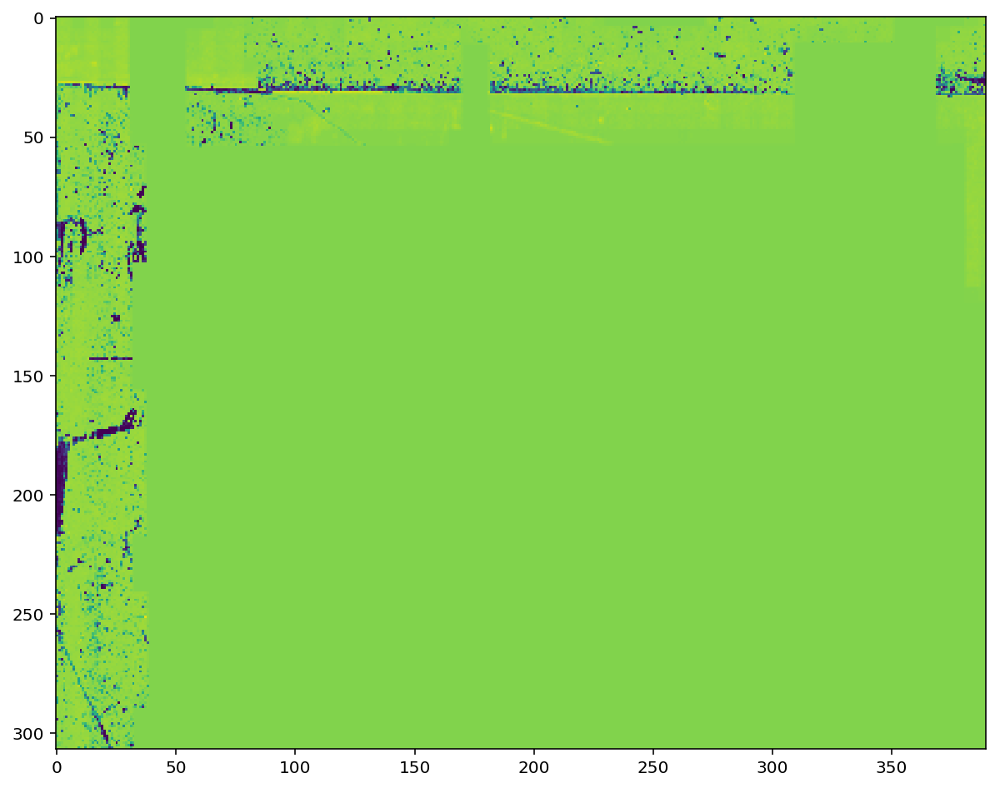

In [172]:
tumor_75_heatmap = np.load('tumor_082.npy')
plt.figure(figsize = (10, 10))
plt.imshow(tumor_75_heatmap)

<Figure size 720x720 with 0 Axes>

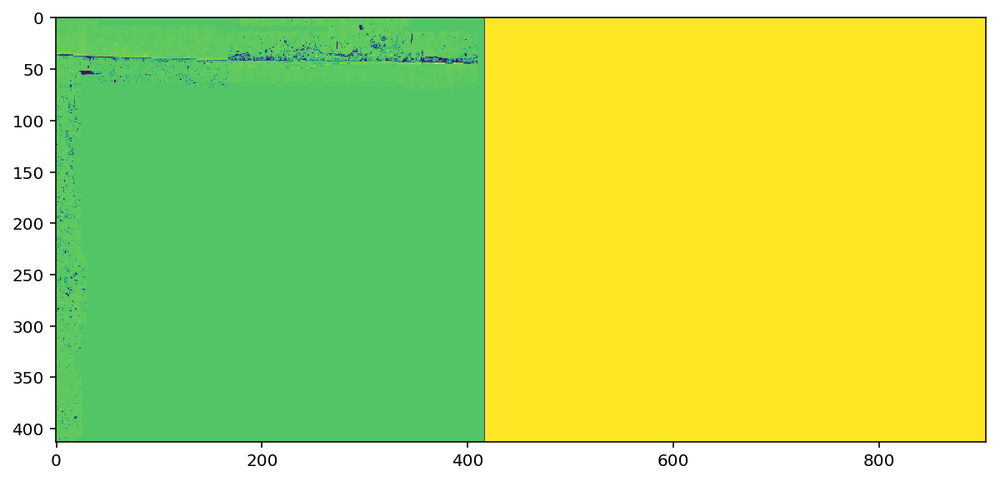

In [177]:
tumor_83_heatmap = np.load('tumor_102.npy')
plt.figure(figsize = (10, 10))
plt.imshow(tumor_83_heatmap)

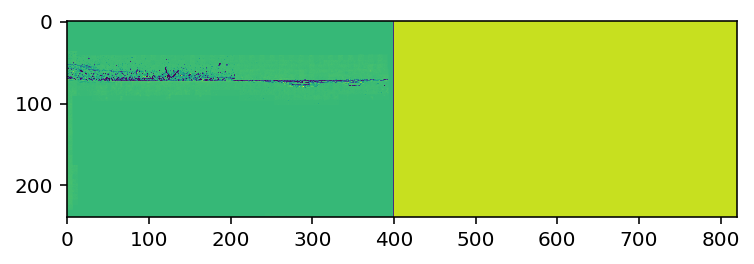

In [174]:
plt.imshow(tumor_82_heatmap)

In [31]:
combined = np.zeros(())

TypeError: Required argument 'object' (pos 1) not found

In [23]:
samplesnew = pd.DataFrame(pd.DataFrame(np.array(thumbnail)))

ValueError: Must pass 2-d input

In [22]:
samplesnew = pd.DataFrame(pd.DataFrame(np.array(thumbnail)))
print(samplesnew)
            # very critical: y value is for row, x is for column
            samplesforpred = samplesnew.loc[yyymin:yyymax, xxxmin:xxxmax]


IndentationError: unexpected indent (<ipython-input-22-41bc7fda95da>, line 4)

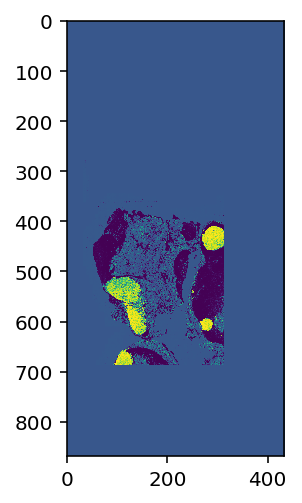

In [15]:
newheatm = np.load('tumor_026.npy')
plt.imshow(newheatm)

Each pixel in these thumbnails corresponds to a 256x256 patch that can be used for training.  White areas in truth mask are cancer regions.

## Tissue area selection

We can use Otsu's method to find areas on slide with tissue.  Pixels with binary==False will be set of patches available for training.

In [86]:
from skimage.filters import threshold_otsu

img = np.array(thumbnail.convert('L')) # convert to grayscale
thresh = threshold_otsu(img)
binary = img > thresh

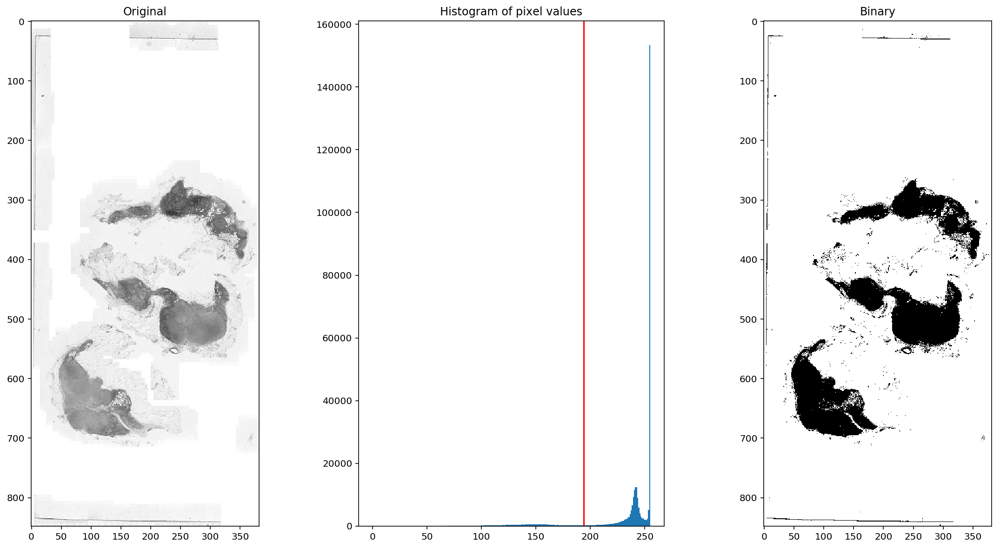

In [87]:
f, axes = plt.subplots(1, 3, figsize=(20, 10));
ax = axes.ravel();
ax[0].imshow(img, cmap='gray');
ax[0].set_title('Original');
ax[1].hist(img.ravel(), bins=256);
ax[1].set_title('Histogram of pixel values');
ax[1].axvline(thresh, color='r');
ax[2].imshow(binary, cmap='gray');
ax[2].set_title('Binary');

## Example Patches

In [88]:
from openslide.deepzoom import DeepZoomGenerator 

tiles = DeepZoomGenerator(slide, tile_size=256, overlap=0, limit_bounds=False)
tiles_truth = DeepZoomGenerator(truth, tile_size=256, overlap=0, limit_bounds=False)


In [20]:
from openslide.deepzoom import DeepZoomGenerator

In [52]:
y_train1=tiles_truth.get_tile(tiles_truth.level_count-1, (100, 680))
y_train1 = to_categorical(y_train1, num_classes=2)
#y_train1_grey = np.array(y_train1.convert('L')) # convert to grayscale
#thresh = threshold_otsu(y_train1_grey)
#binary = y_train1_grey > thresh

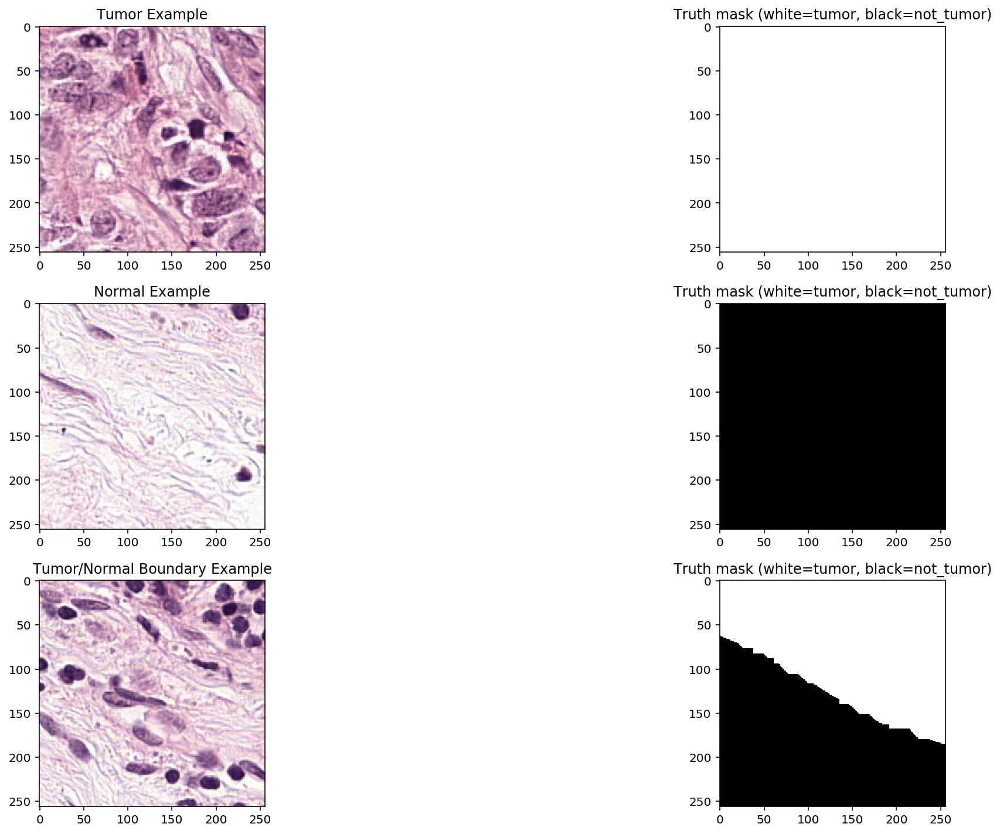

In [89]:
f, axes = plt.subplots(3, 2, figsize=(20, 10))
axes[0, 0].imshow(tiles.get_tile(tiles.level_count-1, (100, 680)));
axes[0, 0].set_title('Tumor Example');
axes[0, 1].imshow(tiles_truth.get_tile(tiles.level_count-1, (100, 680)));
axes[0, 1].set_title('Truth mask (white=tumor, black=not_tumor)')
axes[1, 0].imshow(tiles.get_tile(tiles.level_count-1, (97, 693)));
axes[1, 0].set_title('Normal Example');
axes[1, 1].imshow(tiles_truth.get_tile(tiles_truth.level_count-1, (97, 693)));
axes[1, 1].set_title('Truth mask (white=tumor, black=not_tumor)')
axes[2, 0].imshow(tiles.get_tile(tiles.level_count-1, (97, 692)));
axes[2, 0].set_title('Tumor/Normal Boundary Example');
axes[2, 1].imshow(tiles_truth.get_tile(tiles_truth.level_count-1, (97, 692)));
axes[2, 1].set_title('Truth mask (white=tumor, black=not_tumor)');
plt.tight_layout();

In [9]:
import os.path as osp
from pathlib import Path
import glob
from skimage.filters import threshold_otsu

The boundary example will probably be challenging to predict correctly.

In [11]:
slide_path = '/home/wli/Downloads/CAMELYON16/training/tumor'
#anno_path = '/home/wli/Downloads/CAMELYON16/training/Lesion_annotations'
BASE_TRUTH_DIR = '/home/wli/Downloads/CAMELYON16/masking'
slide_paths = glob.glob(osp.join(slide_path, '*.tif'))
slide_paths.sort()
BASE_TRUTH_DIRS = glob.glob(osp.join(BASE_TRUTH_DIR, '*.tif'))
BASE_TRUTH_DIRS.sort()
#image_pair = zip(tumor_paths, anno_tumor_paths)  
#image_pair = list(image_mask_pair)

In [7]:
print(BASE_TRUTH_DIRS)


['/home/wli/Downloads/CAMELYON16/masking/tumor_001_mask.tif', '/home/wli/Downloads/CAMELYON16/masking/tumor_002_mask.tif', '/home/wli/Downloads/CAMELYON16/masking/tumor_003_mask.tif', '/home/wli/Downloads/CAMELYON16/masking/tumor_004_mask.tif', '/home/wli/Downloads/CAMELYON16/masking/tumor_005_mask.tif', '/home/wli/Downloads/CAMELYON16/masking/tumor_006_mask.tif', '/home/wli/Downloads/CAMELYON16/masking/tumor_007_mask.tif', '/home/wli/Downloads/CAMELYON16/masking/tumor_008_mask.tif', '/home/wli/Downloads/CAMELYON16/masking/tumor_009_mask.tif', '/home/wli/Downloads/CAMELYON16/masking/tumor_010_mask.tif', '/home/wli/Downloads/CAMELYON16/masking/tumor_011_mask.tif', '/home/wli/Downloads/CAMELYON16/masking/tumor_012_mask.tif', '/home/wli/Downloads/CAMELYON16/masking/tumor_013_mask.tif', '/home/wli/Downloads/CAMELYON16/masking/tumor_014_mask.tif', '/home/wli/Downloads/CAMELYON16/masking/tumor_015_mask.tif', '/home/wli/Downloads/CAMELYON16/masking/tumor_016_mask.tif', '/home/wli/Downloads/CA

## Data generator

In [132]:
def find_patches_from_slide(slide_paths, base_truth_dir=BASE_TRUTH_DIR, filter_non_tissue=True):
    """Returns a dataframe of all patches in slide
    input: slide_path: path to WSI file
    output: samples: dataframe with the following columns:
        slide_path: path of slide
        is_tissue: sample contains tissue
        is_tumor: truth status of sample
        tile_loc: coordinates of samples in slide
        
    
    option: base_truth_dir: directory of truth slides
    option: filter_non_tissue: Remove samples no tissue detected
    """
    i=1
    while i < len(slide_paths):
        #sampletotal = pd.DataFrame([])
        base_truth_dir = Path(base_truth_dir)
        slide_contains_tumor = osp.basename(slide_paths[i]).startswith('tumor_')
    
        with openslide.open_slide(slide_paths[i]) as slide:
            thumbnail = slide.get_thumbnail((slide.dimensions[0] / 256, slide.dimensions[1] / 256))
    
            thumbnail_grey = np.array(thumbnail.convert('L')) # convert to grayscale
            thresh = threshold_otsu(thumbnail_grey)
            binary = thumbnail_grey > thresh
    
            patches = pd.DataFrame(pd.DataFrame(binary).stack())
            patches['is_tissue'] = ~patches[0]
            patches.drop(0, axis=1, inplace=True)
            patches['slide_path'] = slide_paths[i]
    
        if slide_contains_tumor:
            truth_slide_path = base_truth_dir / osp.basename(slide_paths[i]).replace('.tif', '_mask.tif')
            with openslide.open_slide(str(truth_slide_path)) as truth:
                thumbnail_truth = truth.get_thumbnail((truth.dimensions[0] / 256, truth.dimensions[1] / 256)) 
        
            patches_y = pd.DataFrame(pd.DataFrame(np.array(thumbnail_truth.convert("L"))).stack())
            patches_y['is_tumor'] = patches_y[0] > 0
            patches_y.drop(0, axis=1, inplace=True)

            samples = pd.concat([patches, patches_y], axis=1)
            #sampletotal.append(pd.concat([patches, patches_y], axis=1))
        else:
            samples = patches
            samples['is_tumor'] = False
            #patches['is_tumor'] = False
            #sampletotal.append(patches)
            
       
        
        if filter_non_tissue:
            samples = samples[samples.is_tissue == True] # remove patches with no tissue
            samples['tile_loc'] = list(samples.index)
            samples.reset_index(inplace=True, drop=True)
        
         i=i+1
        
         samples.append()
     #   sampletotal = sampletotal[sampletotal.is_tissue == True] # remove patches with no tissue
    #    sampletotal['tile_loc'] = list(sampletotal.index)
    #    sampletotal.reset_index(inplace=True, drop=True)
            
        
        
        
        
        return samples

In [12]:
    sampletotal = pd.DataFrame([])
    i=0
    while i < len(slide_paths):
        #sampletotal = pd.DataFrame([])
        base_truth_dir = Path(BASE_TRUTH_DIR)
        slide_contains_tumor = osp.basename(slide_paths[i]).startswith('tumor_')
    
        with openslide.open_slide(slide_paths[i]) as slide:
            thumbnail = slide.get_thumbnail((slide.dimensions[0] / 256, slide.dimensions[1] / 256))
    
            thumbnail_grey = np.array(thumbnail.convert('L')) # convert to grayscale
            thresh = threshold_otsu(thumbnail_grey)
            binary = thumbnail_grey > thresh
    
            patches = pd.DataFrame(pd.DataFrame(binary).stack())
            patches['is_tissue'] = ~patches[0]
            patches.drop(0, axis=1, inplace=True)
            patches['slide_path'] = slide_paths[i]
    
        if slide_contains_tumor:
            truth_slide_path = base_truth_dir / osp.basename(slide_paths[i]).replace('.tif', '_mask.tif')
            with openslide.open_slide(str(truth_slide_path)) as truth:
                thumbnail_truth = truth.get_thumbnail((truth.dimensions[0] / 256, truth.dimensions[1] / 256)) 
        
            patches_y = pd.DataFrame(pd.DataFrame(np.array(thumbnail_truth.convert("L"))).stack())
            patches_y['is_tumor'] = patches_y[0] > 0
            patches_y.drop(0, axis=1, inplace=True)

            samples = pd.concat([patches, patches_y], axis=1)
            #sampletotal.append(pd.concat([patches, patches_y], axis=1))
        else:
            samples = patches
            samples['is_tumor'] = False
            #patches['is_tumor'] = False
            #sampletotal.append(patches)
            
       
        
        #if filter_non_tissue:
        samples = samples[samples.is_tissue == True] # remove patches with no tissue
        samples['tile_loc'] = list(samples.index)
        samples.reset_index(inplace=True, drop=True)
        
        sampletotal=sampletotal.append(samples, ignore_index=True)
        
        i=i+1
        
        



In [152]:
sampletotal=sampletotal.append(samples, ignore_index=True)

In [13]:
sampletotal


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 125)"
1,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 144)"
2,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 145)"
3,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 146)"
4,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 147)"
5,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 181)"
6,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 194)"
7,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 202)"
8,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 203)"
9,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 204)"


In [14]:
sampletotal.is_tumor.value_counts()

False    1847259
True       40218
Name: is_tumor, dtype: int64

In [212]:
drop_indices = np.random.choice(sampletotal['is_tumor'==False].index, 170000, replace=False)


KeyError: False

In [214]:
drop_indices = np.random.choice(np.where(sampletotal['is_tumor'])[0], 170000, replace=False)

ValueError: Cannot take a larger sample than population when 'replace=False'

In [216]:
f=np.where(sampletotal['is_tumor'])[1]

IndexError: tuple index out of range

In [17]:
from pandas import HDFStore
store = HDFStore('store.h5')

store['sampletotal'] = sampletotal  # save it
#store['df']  # load it

/home/wli/env/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2963: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block1_values] [items->['is_tissue', 'slide_path', 'tile_loc']]

  exec(code_obj, self.user_global_ns, self.user_ns)


In [16]:
import tables
from pandas import HDFStore

ImportError: No module named 'tables'

In [18]:
newf = store['sampletotal']

In [19]:
newf

,is_tissue,slide_path,is_tumor,tile_loc
0,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 125)"
1,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 144)"
2,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 145)"
3,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 146)"
4,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 147)"
5,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 181)"
6,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 194)"
7,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 202)"
8,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 203)"
9,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 204)"


In [4]:
idx=sampletotal.index[sampletotal['is_tumor'] == False].tolist()

NameError: name 'sampletotal' is not defined

In [27]:
!tail idx

tail: cannot open 'idx' for reading: No such file or directory


In [28]:
drop_indices = np.random.choice(idx, 1800000, replace=False)

In [29]:
sampletotal_subset = sampletotal.drop(drop_indices)

In [30]:
sampletotal_subset.is_tumor.value_counts()

False    47259
True     40218
Name: is_tumor, dtype: int64

In [40]:
sampletotal_subset

,is_tissue,slide_path,is_tumor,tile_loc
10,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 207)"
13,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 212)"
56,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(2, 21)"
136,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(2, 120)"
171,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(2, 201)"
215,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(2, 248)"
286,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(3, 46)"
291,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(3, 51)"
299,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(3, 59)"
314,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(3, 74)"


In [41]:
sampletotal_subset.reset_index(drop=True, inplace=True)

In [42]:
sampletotal_subset

,is_tissue,slide_path,is_tumor,tile_loc
0,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 207)"
1,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(1, 212)"
2,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(2, 21)"
3,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(2, 120)"
4,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(2, 201)"
5,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(2, 248)"
6,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(3, 46)"
7,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(3, 51)"
8,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(3, 59)"
9,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(3, 74)"


In [91]:
f=np.array(thumbnail_truth.convert("L"))

In [22]:
thumbnail_grey = np.array(thumbnail.convert('L'))
thresh = threshold_otsu(thumbnail_grey)
binary = thumbnail_grey > thresh

In [34]:
f=pd.DataFrame(binary)
f1=pd.DataFrame(f.stack())
f1['istiusse']=~f1[0]
f1['tile_loc']=list(f1.index)

In [133]:
all_tissue_samples = find_patches_from_slide(slide_paths)

In [135]:
all_tissue_samples.iloc[:20]
all_tissue_samples.is_tumor.value_counts()

""


AttributeError: 'DataFrame' object has no attribute 'is_tumor'

In [92]:
all_tissue_samples = find_patches_from_slide(slide_path)
print('Total patches in slide: %d' % len(all_tissue_samples))
all_tissue_samples.iloc[:10]
all_tissue_samples.is_tumor.value_counts()

Total patches in slide: 34521


/Users/liw17/env/lib/python3.6/site-packages/ipykernel_launcher.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,is_tissue,slide_path,is_tumor,tile_loc
0,True,/Users/liw17/Downloads/camelyontest/slides/tum...,False,"(13, 165)"
1,True,/Users/liw17/Downloads/camelyontest/slides/tum...,False,"(14, 165)"
2,True,/Users/liw17/Downloads/camelyontest/slides/tum...,False,"(21, 275)"
3,True,/Users/liw17/Downloads/camelyontest/slides/tum...,False,"(22, 248)"
4,True,/Users/liw17/Downloads/camelyontest/slides/tum...,False,"(22, 249)"
5,True,/Users/liw17/Downloads/camelyontest/slides/tum...,False,"(24, 8)"
6,True,/Users/liw17/Downloads/camelyontest/slides/tum...,False,"(24, 9)"
7,True,/Users/liw17/Downloads/camelyontest/slides/tum...,False,"(24, 10)"
8,True,/Users/liw17/Downloads/camelyontest/slides/tum...,False,"(24, 11)"
9,True,/Users/liw17/Downloads/camelyontest/slides/tum...,False,"(24, 12)"


False    34521
Name: is_tumor, dtype: int64

In [31]:
import cv2
from keras.utils.np_utils import to_categorical

Using TensorFlow backend.


This slide has 34.5k patches containing tissue. Roughly 39% of these patches contain tumor cells.

In [3]:
import cv2
from keras.utils.np_utils import to_categorical

NUM_CLASSES = 2 # not_tumor, tumor

def gen_imgs(samples, batch_size, base_truth_dir=BASE_TRUTH_DIR, shuffle=True):
    """This function returns a generator that 
    yields tuples of (
        X: tensor, float - [batch_size, 256, 256, 3]
        y: tensor, int32 - [batch_size, 256, 256, NUM_CLASSES]
    )
    
    
    input: samples: samples dataframe
    input: batch_size: The number of images to return for each pull
    output: yield (X_train, y_train): generator of X, y tensors
    
    option: base_truth_dir: path, directory of truth slides
    option: shuffle: bool, if True shuffle samples
    """
    
    num_samples = len(samples)
    while 1: # Loop forever so the generator never terminates
        if shuffle:
            samples = samples.sample(frac=1) # shuffle samples
        
        for offset in range(0, num_samples, batch_size):
            batch_samples = samples.iloc[offset:offset+batch_size]
        
            images = []
            masks = []
            for _, batch_sample in batch_samples.iterrows():
                slide_contains_tumor = osp.basename(batch_sample.slide_path).startswith('tumor_')
                
                with openslide.open_slide(batch_sample.slide_path) as slide:
                    tiles = DeepZoomGenerator(slide, tile_size=256, overlap=0, limit_bounds=False)
                    img = tiles.get_tile(tiles.level_count-1, batch_sample.tile_loc[::-1])
                    
                # only load truth mask for tumor slides
                if slide_contains_tumor:
                    truth_slide_path = osp.join(base_truth_dir, osp.basename(batch_sample.slide_path).replace('.tif', '_mask.tif'))
                    with openslide.open_slide(str(truth_slide_path)) as truth:
                        truth_tiles = DeepZoomGenerator(truth, tile_size=256, overlap=0, limit_bounds=False)
                        mask = truth_tiles.get_tile(truth_tiles.level_count-1, batch_sample.tile_loc[::-1])
                        mask = (cv2.cvtColor(np.array(mask), cv2.COLOR_RGB2GRAY) > 0).astype(int)
                else:
                    mask = np.zeros((256, 256))

                images.append(np.array(img))
                masks.append(mask)

            X_train = np.array(images)
            y_train = np.array(masks)
            y_train = to_categorical(y_train, num_classes=2).reshape(y_train.shape[0], 256, 256, 2)
            
            np.save('X_train.npy', X_train)
            np.save('y_train.npy', y_train)
            
            yield X_train, y_train
            
            



Using TensorFlow backend.


NameError: name 'BASE_TRUTH_DIR' is not defined

In [94]:
print(y_train)

NameError: name 'y_train' is not defined

Note:
>Our model output and label tensors are of shape batch_sizex256x256x2.  So for each pixel we have a probability that they belong to class [not_tumor, tumor].  Label tensors are binary [0, 1].

In [241]:
sample_gen = gen_imgs(sampletotal.sample(64, random_state=42), 64,BASE_TRUTH_DIR, shuffle=False)

In [242]:
%time example_x, example_y  = next(sample_gen)

CPU times: user 1.85 s, sys: 583 ms, total: 2.43 s
Wall time: 2.75 s


In [225]:
from tempfile import TemporaryFile
outfile = TemporaryFile()

In [237]:
np.savez(outfile, train_generator)

TypeError: can't pickle generator objects

In [231]:
store['example_x'] = example_x

TypeError: cannot properly create the storer for: [_TYPE_MAP] [group->/example_x (Group) '',value-><class 'numpy.ndarray'>,format->fixed,append->False,kwargs->{'encoding': None}]

In [186]:
example_X.shape

(64, 256, 256, 3)

In [187]:
example_y.shape

(64, 256, 256, 2)

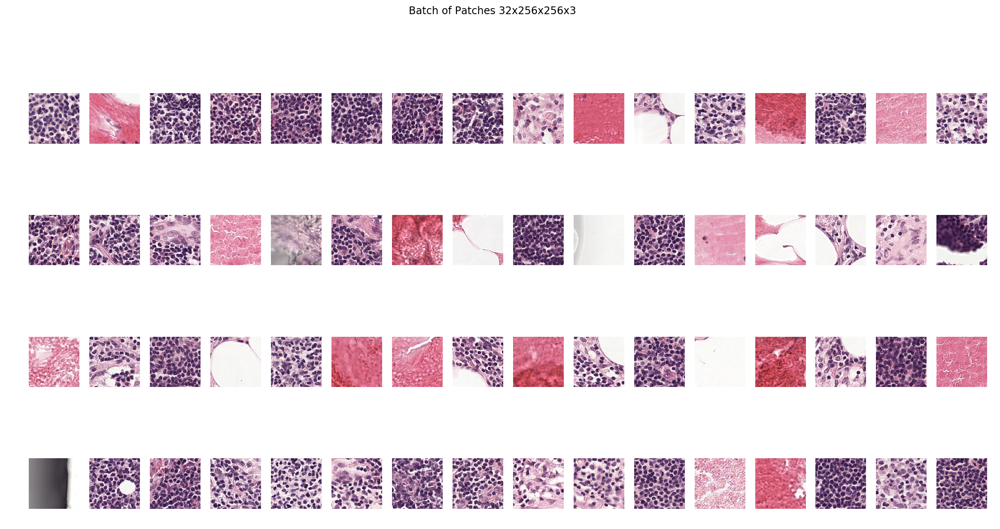

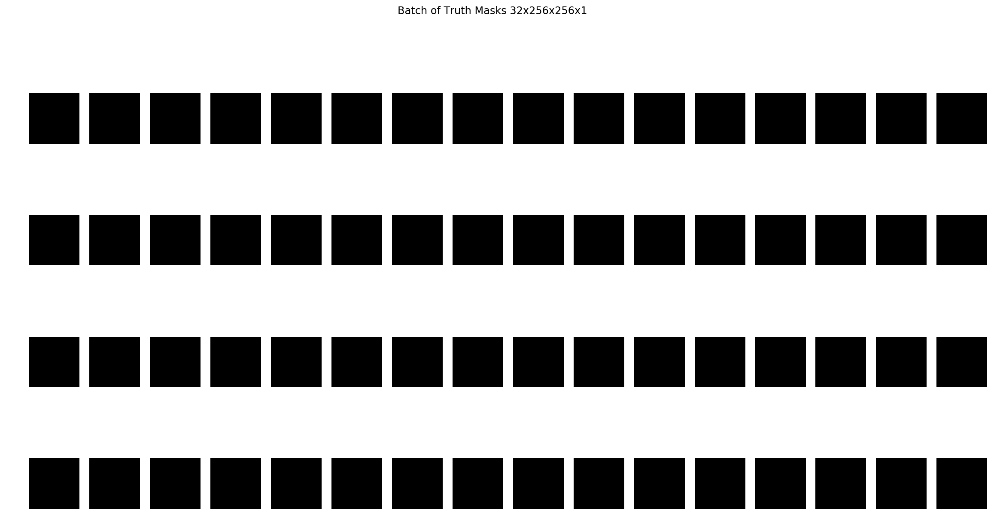

In [188]:
f, axes = plt.subplots(4, 16, figsize=(20, 10));
ax = axes.flatten()
for i in range(0, example_X.shape[0]):
    _ = ax[i].imshow(example_X[i]);
    _ = ax[i].axis('off');
f.suptitle('Batch of Patches 32x256x256x3');
    
f, axes = plt.subplots(4, 16, figsize=(20, 10));
ax = axes.flatten()    
for i in range(0, example_X.shape[0]):
    _ = ax[i].imshow(example_y[i].argmax(axis=2), cmap='gray', vmin=0, vmax=1);
    _ = ax[i].axis('off');
f.suptitle('Batch of Truth Masks 32x256x256x1');

## Define network

This first image segmentation model is based on a fully convolutional network used to predict the left ventricle from cardiac MRI scans (described [here](https://gist.github.com/ajsander/b65061d12f50de3cef5d#file-fcn_tutorial-ipynb)).

Architecture:

0. Lambda, Normalize input (x / 255.0 - 0.5), outputs 256x256x3
1. Convolution1, 5 x 5 kernel, stride 2, outputs 128x128x100
2. Maxpooling1, 2 x 2 window, stride 2, outputs 64x64x100
3. Convolution2, 5 x 5 kernel, stride 2, outputs 32x32x200
4. Maxpooling2, 2 x 2 window, stride 2, outputs 16x16x200
5. Convolution3, 3 x 3 kernel, stride 1, outputs 16x16x300
6. Convolution4, 3 x 3 kernel, stride 1, outputs 16x16x300
7. Dropout, 0.1 rate
8. Convolution5, 1x1 kernel, stride 1, outputs 16x16x2
9. Deconvolution, 31 x 31 kernel, stride 16, outputs 256x256x2

This network is 6 layers deep with 1.8 M trainable parameters.

In [55]:
from keras.models import Sequential
from keras.layers import Lambda, Dropout
from keras.layers.convolutional import Convolution2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D

model = Sequential()
model.add(Lambda(lambda x: x / 255.0 - 0.5, input_shape=(256, 256, 3)))
model.add(Convolution2D(100, (5, 5), strides=(2, 2), activation='elu', padding='same'))
model.add(MaxPooling2D())
model.add(Convolution2D(200, (5, 5), strides=(2, 2), activation='elu', padding='same'))
model.add(MaxPooling2D())
model.add(Convolution2D(300, (3, 3), activation='elu', padding='same'))
model.add(Convolution2D(300, (3, 3), activation='elu',  padding='same'))
model.add(Dropout(0.1))
model.add(Convolution2D(2, (1, 1))) # this is called upscore layer for some reason?
model.add(Conv2DTranspose(2, (31, 31), strides=(16, 16), activation='softmax', padding='same'))

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [26]:
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lambda_1 (Lambda)            (None, 256, 256, 3)       0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 128, 128, 100)     7600      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 64, 64, 100)       0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 32, 200)       500200    
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 16, 16, 200)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 16, 16, 300)       540300    
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 16, 16, 300)       810300    
__________

Note:
> Some model details.  We're using ELU activations instead of RELU units.  I've seen better performance with these, and they address the vanishing gradient problem LINK.
There's a dropout layer after our main conv layers.  We're using cross-entropy of our softmax predictions as our loss function to measure model performance.  Lastly, we use the ADAM optimizer because I'm lazy and I don't want to deal with tuning learning-rate knobs.

## Train model

In [236]:
BATCH_SIZE = 32
N_EPOCHS = 10

NUM_SAMPLES = 10000

In [196]:
#samples = find_patches_from_slide(slide_path)
sampletotalsubset = sampletotal.sample(NUM_SAMPLES, random_state=42)
sampletotalsubset.reset_index(drop=True, inplace=True)

In [197]:
sampletotalsubset.is_tumor.value_counts()

False    9999
True        1
Name: is_tumor, dtype: int64

In [199]:
sampletotal.is_tumor.value_counts()

False    9999
True        1
Name: is_tumor, dtype: int64

In [2]:
from sklearn.model_selection import StratifiedShuffleSplit

# split samples into train and validation set
# use StratifiedShuffleSplit to ensure both sets have same proportions of tumor patches
split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_index, test_index in split.split(sampletotal_subset, sampletotal_subset["is_tumor"]):
        train_samples_subset = sampletotal_subset.loc[train_index]
        validation_samples_subset = sampletotal_subset.loc[test_index]

NameError: name 'sampletotal_subset' is not defined

In [37]:
from sklearn.model_selection import StratifiedShuffleSplit

# split samples into train and validation set
# use StratifiedShuffleSplit to ensure both sets have same proportions of tumor patches
split = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
for train_index, test_index in split.split(sampletotal, sampletotal["is_tumor"]):
        train_samples = sampletotal.loc[train_index]
        validation_samples = sampletotal.loc[test_index]

In [48]:
train_samples_subset

,is_tissue,slide_path,is_tumor,tile_loc
55779,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,True,"(115, 178)"
72152,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,True,"(225, 285)"
72360,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,True,"(233, 271)"
31626,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,True,"(269, 200)"
52160,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,True,"(176, 63)"
17816,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(356, 105)"
46474,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,True,"(123, 120)"
16816,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(267, 215)"
77117,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(170, 233)"
24269,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,True,"(253, 163)"


In [39]:

validation_samples

,is_tissue,slide_path,is_tumor,tile_loc
1174478,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(148, 54)"
822557,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(381, 89)"
976502,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(529, 85)"
1097411,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(341, 137)"
1800659,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(48, 7)"
1331129,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(173, 318)"
1608786,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(190, 187)"
1023620,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(382, 188)"
461585,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(276, 159)"
1339482,True,/home/wli/Downloads/CAMELYON16/training/tumor/...,False,"(189, 447)"


In [34]:
BATCH_SIZE = 32
N_EPOCHS = 10

In [49]:
train_generator_subset = gen_imgs(train_samples_subset, 69980)

In [ ]:
example_x, example_y  = next(train_generator_subset)

In [5]:
example_x.shape

NameError: name 'example_x' is not defined

In [6]:
example_y.shape

NameError: name 'example_y' is not defined

In [235]:
train_generator.is_tumor.value_counts()


AttributeError: 'generator' object has no attribute 'is_tumor'

In [59]:
from datetime import datetime

## TODO Add checkpoint mechanism to save old model before generating new

train_generator = gen_imgs(train_samples, BATCH_SIZE)
validation_generator = gen_imgs(validation_samples, BATCH_SIZE)

# Train model
train_start_time = datetime.now()
model.fit_generator(train_generator, np.ceil(len(train_samples) / BATCH_SIZE),
    validation_data=validation_generator,
    validation_steps=np.ceil(len(validation_samples) / BATCH_SIZE),
    epochs=N_EPOCHS)

train_end_time = datetime.now()
print("Model training time: %.1f minutes" % ((train_end_time - train_start_time).seconds / 60,))

Epoch 1/10
250/250 [==============================] - 929s 4s/step - loss: 0.0295 - acc: 0.9842 - val_loss: 4.0551e-06 - val_acc: 1.0000
Epoch 2/10
 68/250 [=======>......................] - ETA: 10:15 - loss: 3.2366e-06 - acc: 1.0000

KeyboardInterrupt: 

In [24]:
# Save model
model.save('model.h5')

In [1]:
from keras.models import load_model
model = load_model('model.h5')

Using TensorFlow backend.
/home/wli/env/lib/python3.5/site-packages/keras/engine/saving.py:305: UserWarning: Error in loading the saved optimizer state. As a result, your model is starting with a freshly initialized optimizer.
  warnings.warn('Error in loading the saved optimizer '


## Evaluate model

### Predict single patches

In [60]:
def predict_from_model(patch, model):
    """Predict which pixels are tumor.
    
    input: patch: 256x256x3, rgb image
    input: model: keras model
    output: prediction: 256x256x1, per-pixel tumor probability
    """
    
    prediction = model.predict(patch.reshape(1, 256, 256, 3))
    prediction = prediction[:, :, :, 1].reshape(256, 256)
    return prediction

In [61]:
import matplotlib.gridspec as gridspec

def plot_blend(patch, prediction, ax, alpha=0.75):
    """alpha blend patch and prediction.
    https://matplotlib.org/examples/pylab_examples/layer_images.html
    
    input: patch: 256x256x3, rgb image
    input: prediction: 256x256x1, per-pixel tumor probability
    input: ax: maplotlib Axes object
    input: alpha: alpha blend
    """
    
    dx, dy = 0.05, 0.05
    x = np.arange(0, patch.shape[1] - 1, dx)
    y = np.arange(0, patch.shape[0] - 1, dy)
    xmin, xmax, ymin, ymax = np.amin(x), np.amax(x), np.amin(y), np.amax(y)
    extent = xmin, xmax, ymin, ymax

    # fig = plt.figure(frameon=False, figsize=(10, 5))
    Z1 = cv2.cvtColor(patch, code=cv2.COLOR_RGB2GRAY)
    Z2 = prediction

    im1 = ax.imshow(Z1, cmap='gray', extent=extent)
    im2 = ax.imshow(Z2, cmap='jet', alpha=alpha, vmin=0.0, vmax=1.0,
                     extent=extent)
    ax.axis('off');

def plot_patch_with_pred(patch, truth, prediction, title_str='', alpha=0.6):
    """
    input: patch: 256x256x3, rgb image
    input: truth: 256x256x2, onehot output classes (not_tumor, tumor)
    input: prediction: 256x256x1, per-pixel tumor probability
    """
    gs = gridspec.GridSpec(2, 4, width_ratios=[10, 10, 19, 1])
    ax0 = plt.subplot(gs[0, 0])
    ax1 = plt.subplot(gs[0, 1])
    ax2 = plt.subplot(gs[1, 0])
    ax3 = plt.subplot(gs[1, 1])
    ax4 = plt.subplot(gs[:, 2])
    axc = plt.subplot(gs[:, 3])

    ax0.imshow(patch);
    ax0.set_title('Original')
    
    ax1.imshow(truth.argmax(axis=2), cmap='gray', vmin=0, vmax=1);
    ax1.set_title('Truth mask (white=tumor, black=not_tumor)')
    
    p = ax2.imshow(prediction, cmap='jet', vmin=0, vmax=1);
    ax2.set_title('Prediction heatmap')

    ax3.imshow((prediction > 0.5).astype(np.int), cmap='gray', vmin=0, vmax=1);
    ax3.set_title('Prediction mask (white=tumor, black=not_tumor)')
    
    plot_blend(patch, prediction, ax4, alpha)
    ax4.set_title('Original+Prediction blend')
    
    fig = plt.gcf()
    fig.set_size_inches(20, 10)
    fig.suptitle(title_str)
    fig.colorbar(p, cax=axc, orientation="vertical")
    axc.set_title('Probability pixel is tumor')

#### Easy tumor patch

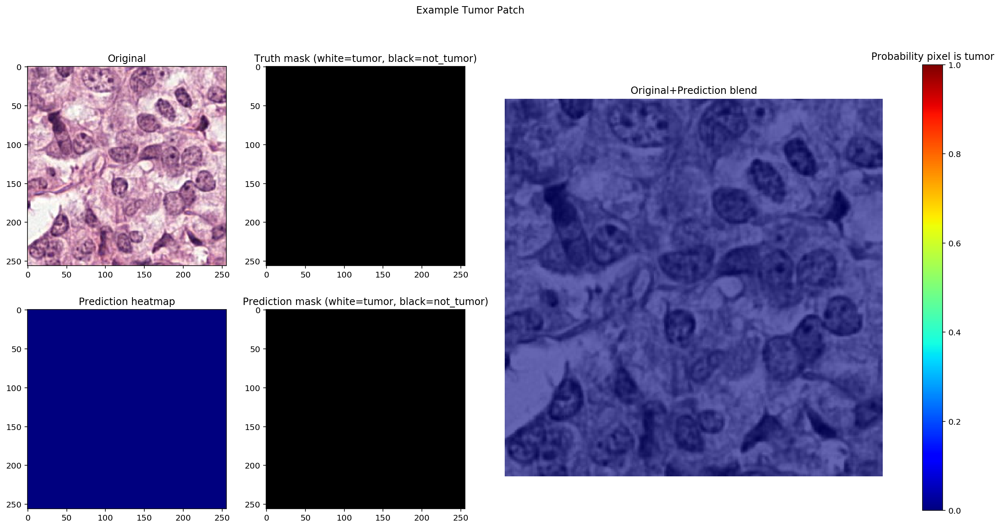

In [78]:
example_patch = example_X[6]
example_truth = example_y[6]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example Tumor Patch')

These calls look good.  Easy all tumor case.

count    65536.000000
mean         0.981368
std          0.063108
min          0.246294
25%          0.993018
50%          0.998482
75%          0.999684
max          0.999993
dtype: float64


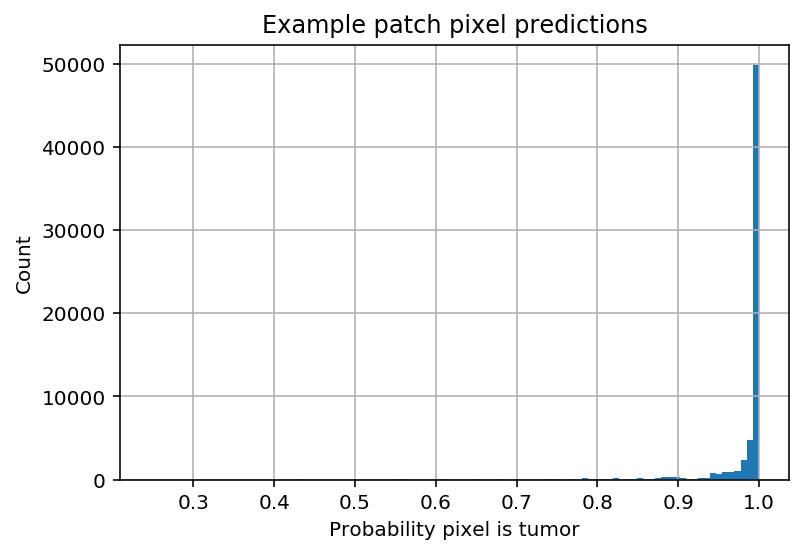

In [37]:
pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

#### Easy normal patch

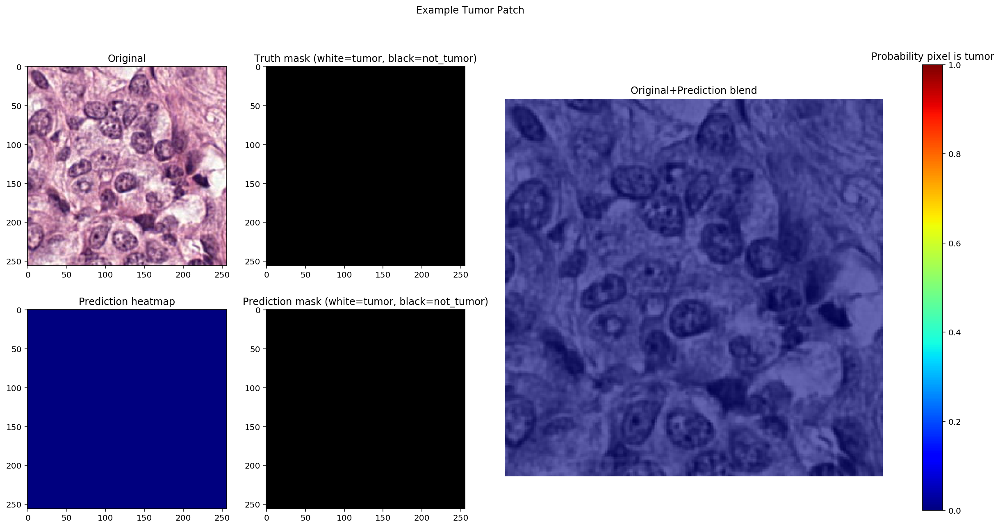

In [66]:
example_patch = example_X[8]
example_truth = example_y[8]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example Tumor Patch')

Normal case called correctly.

count    65536.000000
mean         0.001450
std          0.002486
min          0.000017
25%          0.000272
50%          0.000764
75%          0.001684
max          0.047839
dtype: float64


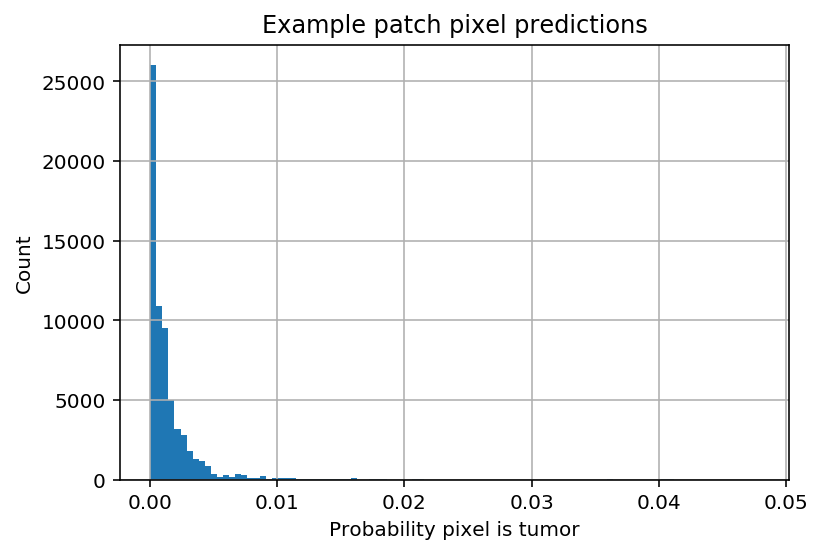

In [39]:
pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

#### Tough border patch

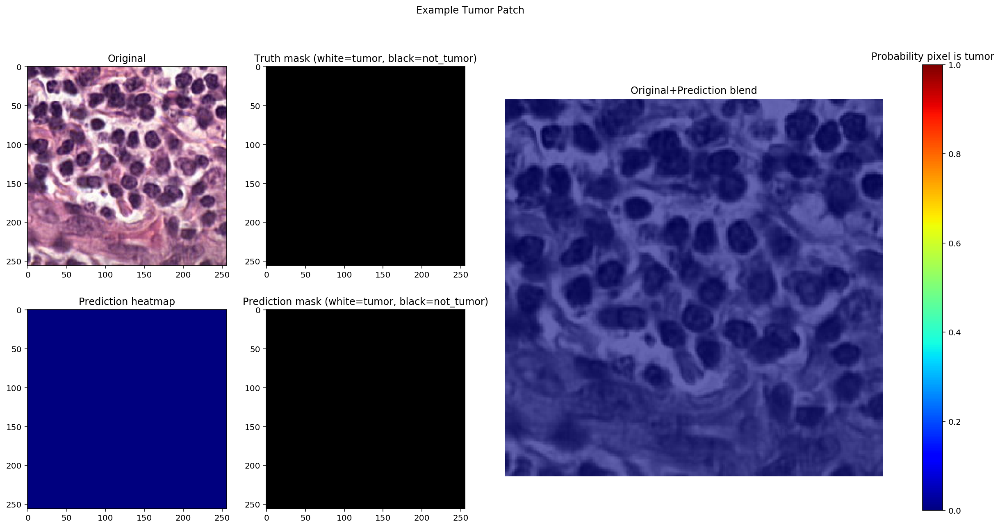

In [79]:
example_patch = example_X[1]
example_truth = example_y[1]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example Tumor Patch')

The model is predicting more tumor than expected.  I could see why it would be thinking the upper portion is cancer.

count    65536.000000
mean         0.223759
std          0.236462
min          0.006918
25%          0.057545
50%          0.118958
75%          0.320645
max          0.944069
dtype: float64


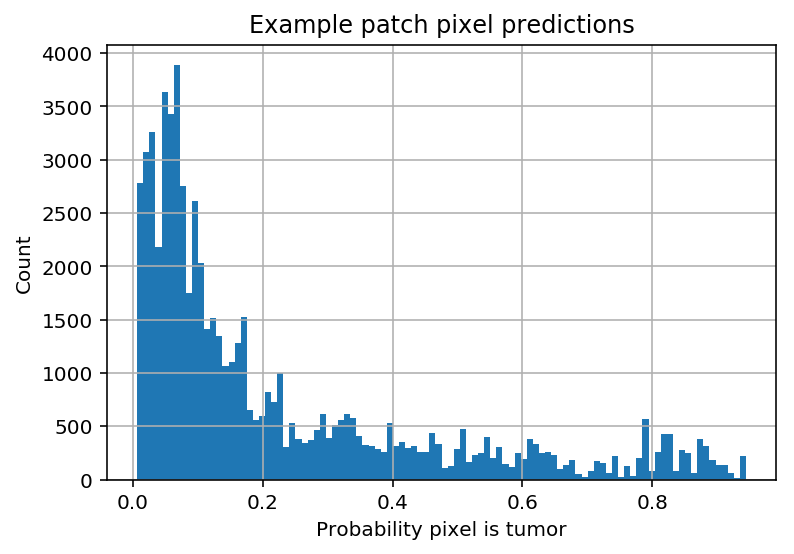

In [41]:
pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

#### Tough normal patch

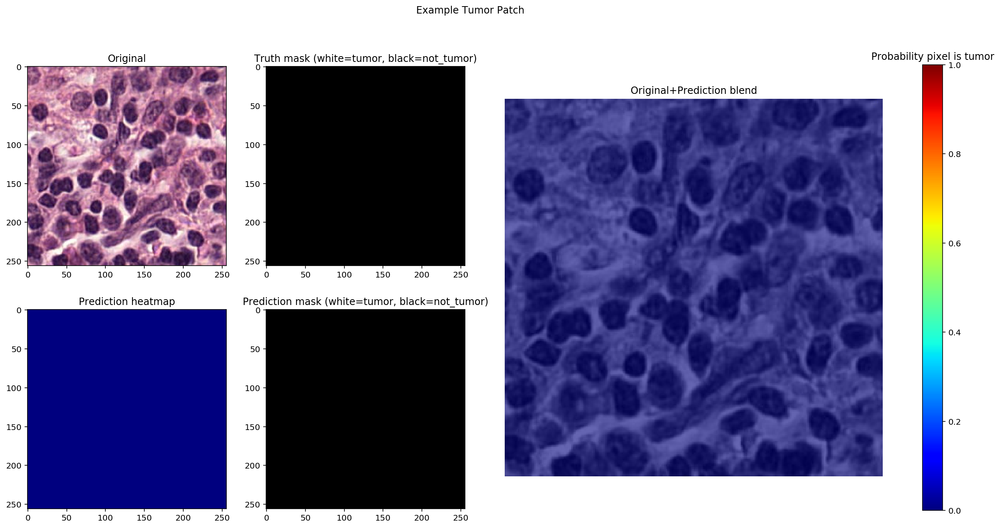

In [80]:
example_patch = example_X[-13]
example_truth = example_y[-13]

prediction = predict_from_model(example_patch, model)
plot_patch_with_pred(example_patch, example_truth, prediction, title_str='Example Tumor Patch')

To my untrained eye, this looks like our model is correctly picking up a contiguous sliver of cancer cells.

count    65536.000000
mean         0.098416
std          0.226665
min          0.000062
25%          0.000990
50%          0.003680
75%          0.043351
max          0.992432
dtype: float64


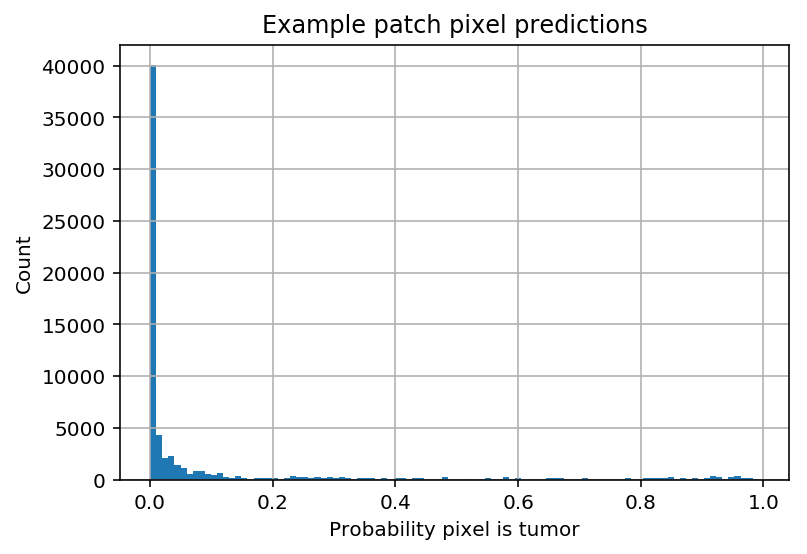

In [43]:
pred_s = pd.Series(prediction.flatten())
print(pred_s.describe())
ax = pred_s.hist(bins=100);
ax.set_title('Example patch pixel predictions');
ax.set_ylabel('Count');
ax.set_xlabel('Probability pixel is tumor');

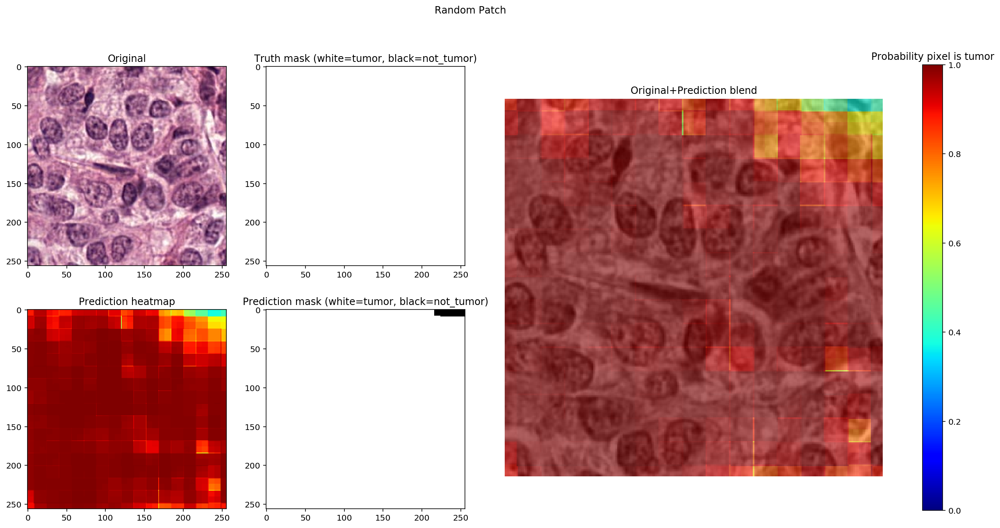

In [58]:
def get_random_patch_from_samples(samples, random_state=None):
    X_i, y_i = next(gen_imgs(samples.sample(1, random_state=random_state), 1))
    return X_i, y_i

X_i, y_i = get_random_patch_from_samples(all_tissue_samples)
pred_i = predict_from_model(X_i, model)
plot_patch_with_pred(X_i[0], y_i[0], pred_i, title_str='Random Patch')

### Calculate Perfomance Metrics

In [126]:
from sklearn.metrics import confusion_matrix
from tqdm import tqdm

def predict_batch_from_model(patches, model):
    """Predict which pixels are tumor.
    
    input: patch: `batch_size`x256x256x3, rgb image
    input: model: keras model
    output: prediction: 256x256x1, per-pixel tumor probability
    """
    predictions = model.predict(patches)
    predictions = predictions[:, :, :, 1]
    return predictions

validation_generator = gen_imgs(validation_samples, BATCH_SIZE)
validation_steps = np.ceil(len(validation_samples) / BATCH_SIZE)

confusion_mtx = np.zeros((2, 2))

for i in tqdm(range(int(validation_steps))):
    X, y  = next(validation_generator)
    preds = predict_batch_from_model(X, model)
    
    y_true = y[:, :, :, 1].ravel()
    y_pred = np.uint8(preds > 0.5).ravel()
    
    confusion_mtx += confusion_matrix(y_true, y_pred, labels=[0, 1])

100%|██████████| 63/63 [07:55<00:00,  6.48s/it]


In [131]:
confusion_mtx

array([[ 78966947.,   3274540.],
       [  6040612.,  42789901.]])

In [134]:
tn = confusion_mtx[0, 0]
fp = confusion_mtx[0, 1]
fn = confusion_mtx[1, 0]
tp = confusion_mtx[1, 1]

In [149]:
accuracy = (tp + tn) / (tp + tn + fp + fn)
recall = tp / (tp + fn)
precision = tp / (tp + fp)
f1_score = 2 * ((precision * recall) / (precision + recall))

print("Accuracy: %.2f" % accuracy)
print("Recall: %.2f" % recall)
print("Precision: %.2f" % precision)
print("F1 Score: %.2f" % f1_score)

Accuracy: 0.93
Recall: 0.88
Precision: 0.93
F1 Score: 0.90


### Predict whole slide

In [151]:
all_samples = find_patches_from_slide(slide_path, filter_non_tissue=False)
print('Total patches in slide: %d' % len(all_samples))
all_samples.iloc[:5]
all_samples.is_tumor.value_counts()

Total patches in slide: 323936


,is_tissue,slide_path,is_tumor,tile_loc
0,False,/home/ubuntu/data/slides/Tumor_009.tif,False,"(0, 0)"
1,False,/home/ubuntu/data/slides/Tumor_009.tif,False,"(0, 1)"
2,False,/home/ubuntu/data/slides/Tumor_009.tif,False,"(0, 2)"
3,False,/home/ubuntu/data/slides/Tumor_009.tif,False,"(0, 3)"
4,False,/home/ubuntu/data/slides/Tumor_009.tif,False,"(0, 4)"


False    309550
True      14386
Name: is_tumor, dtype: int64

In [215]:
from matplotlib import cm
from tqdm import tqdm

output_dir = Path('/home/ubuntu/data/viewers/Tumor_009/slide_files/18')

alpha = 0.5

n_samples = len(all_samples)
n_cols = int(slide.dimensions[0] / 256)
n_rows = int(slide.dimensions[1] / 256)
assert n_cols * n_rows == n_samples

thumbnail = slide.get_thumbnail((n_cols, n_rows))
thumbnail = np.array(thumbnail)

# batch_size = n_cols
batch_size = 32
output_thumbnail_preds = list()
    
for offset in tqdm(list(range(0, n_samples, batch_size))):
    batch_samples = all_samples.iloc[offset:offset+batch_size]
    png_fnames = batch_samples.tile_loc.apply(lambda coord: str(output_dir / ('%d_%d.png' % coord[::-1])))
    
    X, _ = next(gen_imgs(batch_samples, batch_size, shuffle=False))
    
    if batch_samples.is_tissue.nunique() == 1 and batch_samples.iloc[0].is_tissue == False:
        # all patches in this row do not have tissue, skip them all
        output_thumbnail_preds.append(np.zeros(batch_size, dtype=np.float32))
        
        # output pngs
        for i, png_fname in enumerate(png_fnames):
            plt.imsave(png_fname, X[i])
    else:
        # make predictions
        preds = predict_batch_from_model(X, model)
        output_thumbnail_preds.append(preds.mean(axis=(1,2)))
        
        # overlay preds
        # save blended imgs
        for i, png_fname in enumerate(png_fnames):
            pred_i = preds[i]
            X_i = X[i]
            output_img = cv2.cvtColor(X_i, cv2.COLOR_RGB2GRAY)
            output_img2 = cv2.cvtColor(output_img.copy(), cv2.COLOR_GRAY2RGB)

            overlay = np.uint8(cm.jet(pred_i) * 255)[:,:,:3]
            blended = cv2.addWeighted(overlay, alpha, output_img2, 1-alpha, 0, output_img)
            
            plt.imsave(png_fname, blended)
        

output_thumbnail_preds = np.array(output_thumbnail_preds)


100%|██████████| 10123/10123 [4:38:18<00:00,  1.26s/it] 


In [218]:
output_thumbnail_preds = output_thumbnail_preds.reshape(n_rows, n_cols)
truth = openslide.open_slide(truth_path)

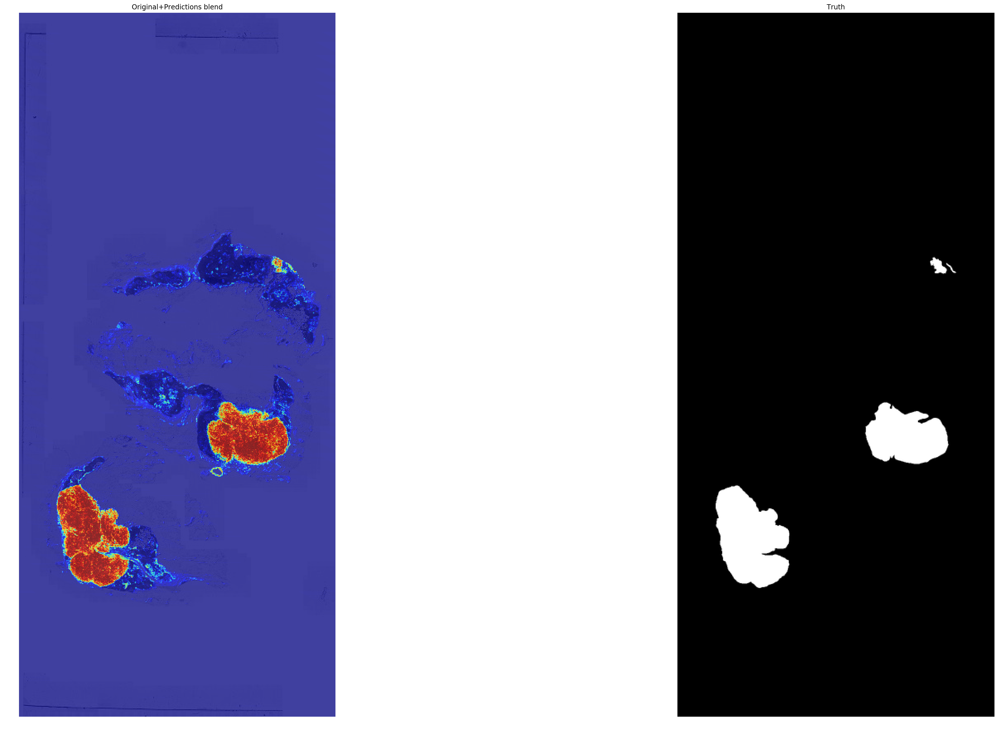

In [219]:
f, axes = plt.subplots(1, 2, figsize=(40, 18))
ax = axes.flatten()
plot_blend(thumbnail, output_thumbnail_preds, ax=ax[0])

thumbnail_truth = truth.get_thumbnail((truth.dimensions[0] / 256, truth.dimensions[1] / 256)) 
ax[1].imshow(thumbnail_truth.convert('L'), cmap='gray');
ax[0].set_title('Original+Predictions blend')
ax[1].set_title('Truth')
ax[1].axis('off');
plt.tight_layout();

In [193]:
%matplotlib inline

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

pred_dim_dir = '/home/wli/Downloads/pred/dimensions/'
pred_dim_paths = glob.glob(osp.join(pred_dim_dir, '*.npy'))
pred_dim_paths.sort()

pred_rawheatmap_dir = '/home/wli/Downloads/pred/rawheatmap/'
pred_rawheatmap_paths = glob.glob(osp.join(pred_rawheatmap_dir, '*.npy'))
pred_rawheatmap_paths.sort()

for i in range(len(pred_dim_paths)):
    pred_dim = np.load(pred_dim_paths[i])
    pred_heatmap = np.load(pred_rawheatmap_paths[i])
    
    if pred_dim[7]*pred_dim[8] == len(pred_heatmap):
        heatmap_final = pred_heatmap.reshape(pred_dim[7], pred_dim[8])
        
    else:
        
        heatmap_new = pred_heatmap[:pred_dim[7]*pred_dim[8]]
        heatmap_final = heatmap_new.reshape(pred_dim[7], pred_dim[8])
        
        
heatmap_final_final = np.zeros((pred_dim[0], pred_dim[1]), heatmap_final.dtype)

heatmap_final_final[:]=0.2722071

heatmap_final_final[pred_dim[5]-1:pred_dim[6], pred_dim[3]-1:pred_dim[4]] = heatmap_final

np.save('/home/wli/Downloads/pred/realheatmap/%s' % (osp.splitext(osp.basename(pred_ds[i]))[0]), heatmap_final_final)
        


In [2]:
import numpy as np

import matplotlib.pyplot as plt


In [102]:
newheatm = np.load('101616tumor_026.npy')

In [106]:
heat=newheatm.reshape(552, 380)


Final predictions for whole slide highlight 4 main tumor lesions in slide.

<Figure size 1080x1080 with 0 Axes>

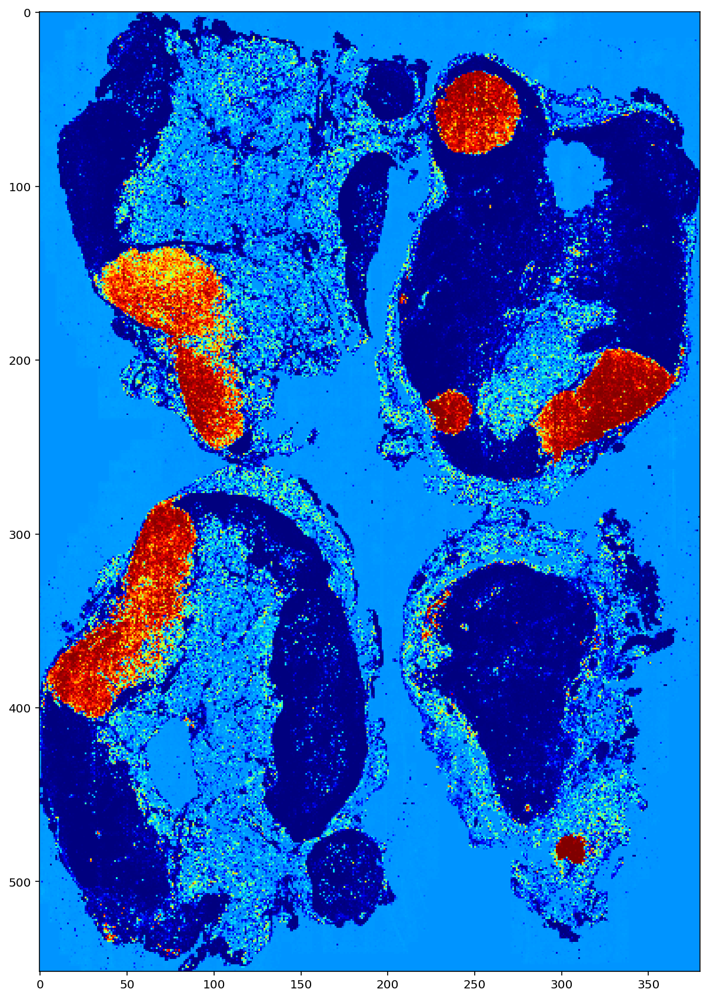

In [118]:
plt.figure(figsize=(15,15))
plt.imshow(heat, cmap = 'jet')

In [110]:
np.save('heat_map_tumor_026', heat)


([array([ 18.,  19., 511.,   4.,   0.,   0.,   0.,   0.,   0.,   0.]),
  array([ 60.,   3., 486.,   1.,   0.,   1.,   1.,   0.,   0.,   0.]),
  array([ 59.,   6., 476.,   3.,   2.,   1.,   3.,   0.,   1.,   1.]),
  array([ 69.,   8., 468.,   0.,   2.,   0.,   1.,   3.,   0.,   1.]),
  array([ 78.,   2., 466.,   2.,   1.,   0.,   0.,   1.,   2.,   0.]),
  array([ 77.,   3., 458.,   1.,   1.,   3.,   1.,   4.,   3.,   1.]),
  array([ 77.,   5., 456.,   2.,   0.,   0.,   1.,   3.,   4.,   4.]),
  array([ 78.,   3., 456.,   2.,   0.,   0.,   0.,   4.,   2.,   7.]),
  array([ 81.,   5., 446.,   0.,   1.,   1.,   1.,   2.,   5.,  10.]),
  array([ 83.,   6., 437.,   1.,   2.,   3.,   1.,   2.,   2.,  15.]),
  array([ 78.,   8., 436.,   5.,   2.,   1.,   1.,   3.,   4.,  14.]),
  array([107.,   5., 413.,   1.,   2.,   1.,   2.,   1.,   4.,  16.]),
  array([124.,   6., 394.,   2.,   0.,   0.,   0.,   2.,   3.,  21.]),
  array([130.,   7., 387.,   0.,   0.,   0.,   0.,   2.,   1.,  25.]),
  arra

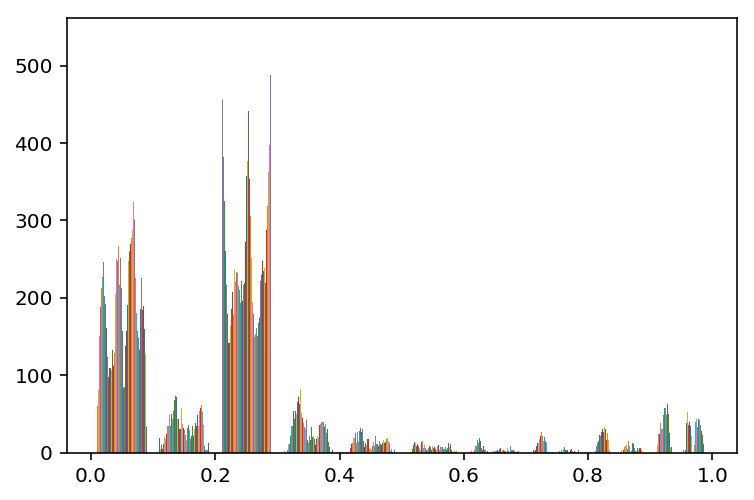

In [112]:
plt.hist(heat)

In [5]:
newheatm = newheatm*255

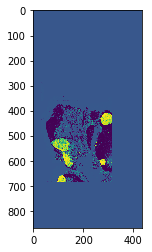

In [6]:
plt.imshow(newheatm)

In [113]:
dim_026=np.load('1016dimensions_tumor_026.npy')

In [114]:
dim_026

array([985, 434,   3,  42, 421, 376, 927, 552, 380])

In [145]:
from scipy.misc import imsave
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os.path as osp
import openslide
from pathlib import Path
from skimage.filters import threshold_otsu
import glob
#before importing HDFStore, make sure 'tables' is installed by pip3 install tables
from pandas import HDFStore
from openslide.deepzoom import DeepZoomGenerator
from sklearn.model_selection import StratifiedShuffleSplit
from PIL import Image
#import tensorflow as tf

#config = tf.ConfigProto()
#config.gpu_options.allow_growth = True
#session = tf.Session(config=config)

#print('Hi, patch extraction can take a while, please be patient...')
#slide_path = '/raida/wjc/CAMELYON16/training/tumor'
#slide_path = '/home/wli/Downloads/CAMELYON16/training/tumor'
slide_path = '/home/wli/Documents/predtest/tumor/'

#Heatmap_path = '/home/wli/Downloads/pred/realheatmap_bbox/'
Heatmap_path = '/home/wli/Documents/predtest/heatmap_bbox/'

#BASE_TRUTH_DIR = '/raida/wjc/CAMELYON16/training/masking'
#BASE_TRUTH_DIR = '/home/wli/Downloads/CAMELYON16/masking'
BASE_TRUTH_DIR = '/home/wli/Documents/predtest/mask/'

dimension_path = '/home/wli/Documents/predtest/dim/'
slide_paths = glob.glob(osp.join(slide_path, '*.tif'))
slide_paths.sort()
BASE_TRUTH_DIRS = glob.glob(osp.join(BASE_TRUTH_DIR, '*.tif'))
BASE_TRUTH_DIRS.sort()
Heat_map_paths = glob.glob(osp.join(Heatmap_path, '*.npy'))
Heat_map_paths.sort()
dimension_paths = glob.glob(osp.join(dimension_path, '*.npy'))
dimension_paths.sort()

#image_pair = zip(tumor_paths, anno_tumor_paths)  
#image_pair = list(image_mask_pair)

false_positive_patch_path = '/home/wli/Downloads/false_positive_patches'

In [147]:
i=0

In [149]:
pred = np.load(Heat_map_paths[i])

pred_dim = np.load(dimension_paths[i])

pred_binary = (pred > 0.5)*1

pred_patches = pd.DataFrame(pd.DataFrame(pred_binary).stack())

pred_patches['pred_is_tumor'] = pred_patches[0]



            

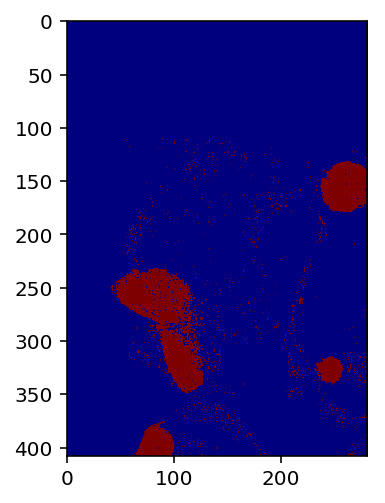

In [151]:
plt.imshow(pred_binary, cmap = 'jet')

In [189]:
pred.shape

(408, 282)

In [207]:
pred_patches.reset_index(inplace=True, drop=True)
pred_patches

,0,pred_is_tumor
0,0,0
1,0,0
2,0,0
3,0,0
4,0,0
5,0,0
6,0,0
7,0,0
8,0,0
9,0,0


In [190]:
truth_slide_path = BASE_TRUTH_DIRS[i]

with openslide.open_slide(str(truth_slide_path)) as truth:
        thumbnail_truth = truth.get_thumbnail((truth.dimensions[0] / 224, truth.dimensions[1] / 224))
        thumbnail_truth_gray = pd.DataFrame(np.array(thumbnail_truth.convert("L")))

        thumbnail_truth_roi = thumbnail_truth_gray.loc[pred_dim[5]:pred_dim[6], pred_dim[3]:pred_dim[4]]

In [191]:
thumbnail_truth_roi

,32,33,34,35,36,37,38,39,40,41,...,304,305,306,307,308,309,310,311,312,313
279,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
280,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
281,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
282,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
283,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
284,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
285,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
286,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
287,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
288,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [162]:
thumbnail_truth_roi

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [161]:
base_truth_dir = Path(BASE_TRUTH_DIR)

In [192]:
with openslide.open_slide(slide_paths[i]) as slide:

        thumbnail = slide.get_thumbnail((slide.dimensions[0] / 224, slide.dimensions[1] / 224))
    
        patches = pd.DataFrame(np.array(thumbnail.convert("L")))
        
        samplesforpred = patches.loc[pred_dim[5]:pred_dim[6], pred_dim[3]:pred_dim[4]]


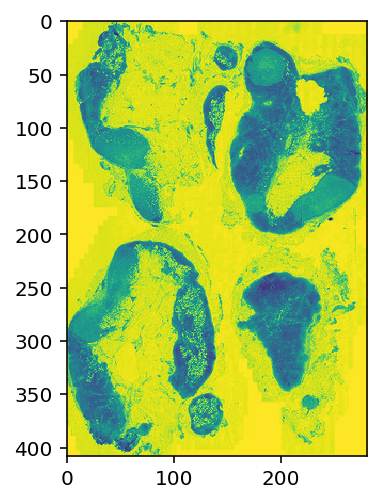

In [193]:
plt.imshow(samplesforpred)

In [194]:
samplesforpredfinal = pd.DataFrame(samplesforpred.stack())


samplesforpredfinal['tile_loc'] = list(samplesforpredfinal.index)



samplesforpredfinal.reset_index(inplace=True, drop=True)


samplesforpredfinal['slide_path'] = slide_paths[i]


In [195]:
samplesforpredfinal

,0,tile_loc,slide_path
0,255,"(279, 32)",/home/wli/Documents/predtest/tumor/tumor_026.tif
1,255,"(279, 33)",/home/wli/Documents/predtest/tumor/tumor_026.tif
2,255,"(279, 34)",/home/wli/Documents/predtest/tumor/tumor_026.tif
3,255,"(279, 35)",/home/wli/Documents/predtest/tumor/tumor_026.tif
4,255,"(279, 36)",/home/wli/Documents/predtest/tumor/tumor_026.tif
5,255,"(279, 37)",/home/wli/Documents/predtest/tumor/tumor_026.tif
6,255,"(279, 38)",/home/wli/Documents/predtest/tumor/tumor_026.tif
7,255,"(279, 39)",/home/wli/Documents/predtest/tumor/tumor_026.tif
8,255,"(279, 40)",/home/wli/Documents/predtest/tumor/tumor_026.tif
9,254,"(279, 41)",/home/wli/Documents/predtest/tumor/tumor_026.tif


In [205]:
patches_y = pd.DataFrame(thumbnail_truth_roi.stack())

patches_y['is_tumor'] = (patches_y[0] > 0)*1
patches_y.reset_index(inplace=True, drop=False)


In [206]:
patches_y

,level_0,level_1,0,is_tumor
0,279,32,0,0
1,279,33,0,0
2,279,34,0,0
3,279,35,0,0
4,279,36,0,0
5,279,37,0,0
6,279,38,0,0
7,279,39,0,0
8,279,40,0,0
9,279,41,0,0


In [203]:
samplesforpredfinal['is_tumor'] = patches_y['is_tumor']

In [208]:
samplesforpredfinal['pred_is_tumor'] = pred_patches['pred_is_tumor']

In [209]:
samplesforpredfinal

,0,tile_loc,slide_path,is_tumor,pred_is_tumor
0,255,"(279, 32)",/home/wli/Documents/predtest/tumor/tumor_026.tif,0,0
1,255,"(279, 33)",/home/wli/Documents/predtest/tumor/tumor_026.tif,0,0
2,255,"(279, 34)",/home/wli/Documents/predtest/tumor/tumor_026.tif,0,0
3,255,"(279, 35)",/home/wli/Documents/predtest/tumor/tumor_026.tif,0,0
4,255,"(279, 36)",/home/wli/Documents/predtest/tumor/tumor_026.tif,0,0
5,255,"(279, 37)",/home/wli/Documents/predtest/tumor/tumor_026.tif,0,0
6,255,"(279, 38)",/home/wli/Documents/predtest/tumor/tumor_026.tif,0,0
7,255,"(279, 39)",/home/wli/Documents/predtest/tumor/tumor_026.tif,0,0
8,255,"(279, 40)",/home/wli/Documents/predtest/tumor/tumor_026.tif,0,0
9,254,"(279, 41)",/home/wli/Documents/predtest/tumor/tumor_026.tif,0,0


In [199]:



        
samples = pd.concat([samplesforpredfinal, patches_y['is_tumor'], pred_patches['pred_is_tumor']], axis=1)

#samples['tile_loc'] = list(samples.index)
#samples.reset_index(inplace=True, drop=True)



/home/wli/env/lib/python3.5/site-packages/pandas/core/indexes/api.py:69: RuntimeWarning: unorderable types: int() < tuple(), sort order is undefined for incomparable objects
  index = _union_indexes(indexes, sort=sort)


TypeError: object of type 'int' has no len()

In [210]:
samples = samplesforpredfinal[samplesforpredfinal.pred_is_tumor > samplesforpredfinal.is_tumor]

In [211]:
samples

,0,tile_loc,slide_path,is_tumor,pred_is_tumor
31109,253,"(389, 121)",/home/wli/Documents/predtest/tumor/tumor_026.tif,0,1
31358,156,"(390, 88)",/home/wli/Documents/predtest/tumor/tumor_026.tif,0,1
31392,240,"(390, 122)",/home/wli/Documents/predtest/tumor/tumor_026.tif,0,1
31413,242,"(390, 143)",/home/wli/Documents/predtest/tumor/tumor_026.tif,0,1
31435,127,"(390, 165)",/home/wli/Documents/predtest/tumor/tumor_026.tif,0,1
31639,159,"(391, 87)",/home/wli/Documents/predtest/tumor/tumor_026.tif,0,1
31696,217,"(391, 144)",/home/wli/Documents/predtest/tumor/tumor_026.tif,0,1
31717,129,"(391, 165)",/home/wli/Documents/predtest/tumor/tumor_026.tif,0,1
31723,241,"(391, 171)",/home/wli/Documents/predtest/tumor/tumor_026.tif,0,1
31966,245,"(392, 132)",/home/wli/Documents/predtest/tumor/tumor_026.tif,0,1


In [ ]:
    base_truth_dir = Path(BASE_TRUTH_DIR)
    slide_contains_tumor = osp.basename(slide_paths[i]).startswith('tumor_')

    #pred = np.load('realheatmap.npy')
    pred = np.load(Heat_map_paths[i])

    pred_dim = np.load(dimension_path[i])

    pred_binary = (pred > 0.5)*1

    pred_patches = pd.DataFrame(pd.DataFrame(pred_binary).stack())

    pred_patches['pred_is_tumor'] = pred_patches[0]


    with openslide.open_slide(slide_paths[i]) as slide:

        thumbnail = slide.get_thumbnail((slide.dimensions[0] / 224, slide.dimensions[1] / 224))
    
        patches = pd.DataFrame(pd.DataFrame(binary).stack())

        
        
    
    if slide_contains_tumor:

        truth_slide_path = base_truth_dir / osp.basename(slide_paths[i]).replace('.tif', '_mask.tif')

        with openslide.open_slide(str(truth_slide_path)) as truth:
            thumbnail_truth = truth.get_thumbnail((truth.dimensions[0] / 224, truth.dimensions[1] / 224))

            thumbnail_truth_roi = thumbnail_truth[pred_dim[5]:pred_dim[6]+1, pred_dim[3]:pred_dim[4]+1, : ]
        
        patches_y = pd.DataFrame(pd.DataFrame(np.array(thumbnail_truth_roi.convert("L"))).stack())
        patches_y['is_tumor'] = (patches_y[0] > 0)*1

        patches['slide_path'] = slide_paths[i]

        
        samples = pd.concat([patches, patches_y, pred_patches], axis=1)

        samples['tile_loc'] = list(samples.index)
        samples.reset_index(inplace=True, drop=True)

        samples = samples[samples.pred_is_tumor > samples.is_tumor]
        
    else:

        samples = pred_patches

        samples['tile_loc'] = list(samples.index)

        samples.reset_index(inplace=True, drop=True)
        samples = samples[samples.pred_is_tumor > 0]


In [213]:
from pandas import HDFStore

In [214]:
store = HDFStore('/home/wli/Downloads/false_positive_patches/false_positive_patch_index.h5')

In [215]:
index = store.get('sampletotal')

In [216]:
index

,0,tile_loc,slide_path,is_tumor,pred_is_tumor
0,NaN,NaN,NaN,0.0,1.0
1,NaN,NaN,NaN,0.0,1.0
2,NaN,NaN,NaN,0.0,1.0
3,NaN,NaN,NaN,0.0,1.0
4,NaN,NaN,NaN,0.0,1.0
5,NaN,NaN,NaN,0.0,1.0
6,NaN,NaN,NaN,0.0,1.0
7,NaN,NaN,NaN,0.0,1.0
8,NaN,NaN,NaN,0.0,1.0
9,NaN,NaN,NaN,0.0,1.0


In [217]:
store['sampletotal'] = index

/home/wli/env/lib/python3.5/site-packages/ipykernel_launcher.py:1: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->axis0] [items->None]

  """Entry point for launching an IPython kernel.
/home/wli/env/lib/python3.5/site-packages/ipykernel_launcher.py:1: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->block0_items] [items->None]

  """Entry point for launching an IPython kernel.
/home/wli/env/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2963: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block1_values] [items->['tile_loc', 'slide_path']]

  exec(code_obj, self.user_global_ns, self.user_ns)


In [218]:
index

,0,tile_loc,slide_path,is_tumor,pred_is_tumor
0,NaN,NaN,NaN,0.0,1.0
1,NaN,NaN,NaN,0.0,1.0
2,NaN,NaN,NaN,0.0,1.0
3,NaN,NaN,NaN,0.0,1.0
4,NaN,NaN,NaN,0.0,1.0
5,NaN,NaN,NaN,0.0,1.0
6,NaN,NaN,NaN,0.0,1.0
7,NaN,NaN,NaN,0.0,1.0
8,NaN,NaN,NaN,0.0,1.0
9,NaN,NaN,NaN,0.0,1.0


In [219]:
df_index = pd.read_pickle("/home/wli/Downloads/false_positive_patches/false_positive_patch_index.pkl")

In [220]:
df_index

,0,tile_loc,slide_path,is_tumor,pred_is_tumor
0,NaN,NaN,NaN,0.0,1.0
1,NaN,NaN,NaN,0.0,1.0
2,NaN,NaN,NaN,0.0,1.0
3,NaN,NaN,NaN,0.0,1.0
4,NaN,NaN,NaN,0.0,1.0
5,NaN,NaN,NaN,0.0,1.0
6,NaN,NaN,NaN,0.0,1.0
7,NaN,NaN,NaN,0.0,1.0
8,NaN,NaN,NaN,0.0,1.0
9,NaN,NaN,NaN,0.0,1.0


In [230]:
#! /usr/bin/env python3
from scipy.misc import imsave
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os.path as osp
import openslide
from pathlib import Path
from skimage.filters import threshold_otsu
import glob
#before importing HDFStore, make sure 'tables' is installed by pip3 install tables
from pandas import HDFStore
from openslide.deepzoom import DeepZoomGenerator
from sklearn.model_selection import StratifiedShuffleSplit
from PIL import Image
from pandas import HDFStore
#import tensorflow as tf

#config = tf.ConfigProto()
#config.gpu_options.allow_growth = True
#session = tf.Session(config=config)

print('Hi, patch extraction can take a while, please be patient...')
#slide_path = '/raida/wjc/CAMELYON16/training/tumor'
slide_path = '/home/wli/Downloads/CAMELYON16/training/tumor'

Heatmap_path = '/home/wli/Downloads/pred/realheatmap_bbox/'
#BASE_TRUTH_DIR = '/raida/wjc/CAMELYON16/training/masking'
BASE_TRUTH_DIR = '/home/wli/Downloads/CAMELYON16/masking'
dimension_path = '/home/wli/Downloads/pred/dimensions/'
slide_paths = glob.glob(osp.join(slide_path, '*.tif'))
slide_paths.sort()
BASE_TRUTH_DIRS = glob.glob(osp.join(BASE_TRUTH_DIR, '*.tif'))
BASE_TRUTH_DIRS.sort()
Heat_map_paths = glob.glob(osp.join(Heatmap_path, '*.npy'))
Heat_map_paths.sort()
dimension_paths = glob.glob(osp.join(dimension_path, '*.npy'))
dimension_paths.sort()

#image_pair = zip(tumor_paths, anno_tumor_paths)  
#image_pair = list(image_mask_pair)

false_positive_patch_path = '/home/wli/Downloads/false_positive_patches'

sampletotal = pd.DataFrame([])
i=0
while i < len(slide_paths):
    #sampletotal = pd.DataFrame([])
    base_truth_dir = Path(BASE_TRUTH_DIR)
    slide_contains_tumor = osp.basename(slide_paths[i]).startswith('tumor_')

    #pred = np.load('realheatmap.npy')
    pred = np.load(Heat_map_paths[i])

    pred_dim = np.load(dimension_paths[i])

    pred_binary = (pred > 0.5)*1

    pred_patches = pd.DataFrame(pd.DataFrame(pred_binary).stack())

########################################################################################
## make a new column to record if a patch is a tumor
########################################################################################
    pred_patches['pred_is_tumor'] = pred_patches[0]

    pred_patches.reset_index(inplace=True, drop=True)



    with openslide.open_slide(slide_paths[i]) as slide:

        thumbnail = slide.get_thumbnail((slide.dimensions[0] / 224, slide.dimensions[1] / 224))

        patches = pd.DataFrame(np.array(thumbnail.convert("L")))
        samplesforpred = patches.loc[pred_dim[5]:pred_dim[6], pred_dim[3]:pred_dim[4]]

        #patches = pd.DataFrame(pd.DataFrame(binary).stack())

        samplesforpredfinal = pd.DataFrame(samplesforpred.stack())


        samplesforpredfinal['tile_loc'] = list(samplesforpredfinal.index)



        samplesforpredfinal.reset_index(inplace=True, drop=True)


        samplesforpredfinal['slide_path'] = slide_paths[i]

        
    
    if slide_contains_tumor:

        truth_slide_path = base_truth_dir / osp.basename(slide_paths[i]).replace('.tif', '_mask.tif')

        with openslide.open_slide(str(truth_slide_path)) as truth:
            thumbnail_truth = truth.get_thumbnail((truth.dimensions[0] / 224, truth.dimensions[1] / 224))

            #thumbnail_truth_gray = np.array(thumbnail_truth.convert("L"))
            thumbnail_truth_gray = pd.DataFrame(np.array(thumbnail_truth.convert("L")))

            #thumbnail_truth_roi = thumbnail_truth_gray[pred_dim[5]:pred_dim[6], pred_dim[3]:pred_dim[4]]
            thumbnail_truth_roi = thumbnail_truth_gray.loc[pred_dim[5]:pred_dim[6], pred_dim[3]:pred_dim[4]]

        #patches_y = pd.DataFrame(pd.DataFrame(np.array(thumbnail_truth_roi.convert("L"))).stack())
        patches_y = pd.DataFrame(thumbnail_truth_roi.stack())

        patches_y['is_tumor'] = (patches_y[0] > 0)*1

        patches_y.reset_index(inplace=True, drop=True)


        #patches['slide_path'] = slide_paths[i]

        
        #samples = pd.concat([patches, patches_y, pred_patches], axis=1)

        #samples['tile_loc'] = list(samples.index)
        #samples.reset_index(inplace=True, drop=True)

        #samples = samples[samples.pred_is_tumor > samples.is_tumor]
        samplesforpredfinal['is_tumor'] = patches_y['is_tumor']
        samplesforpredfinal['pred_is_tumor'] = pred_patches['pred_is_tumor']
        samples = samplesforpredfinal[samplesforpredfinal.pred_is_tumor > samplesforpredfinal.is_tumor]
        
    else:

        #samples = pred_patches

        samplesforpredfinal['pred_is_tumor'] = pred_patches['pred_is_tumor']

        #samples['tile_loc'] = list(samples.index)

        #samples.reset_index(inplace=True, drop=True)
        samples = samplesforpredfinal[samplesforpredfinal.pred_is_tumor > 0]

        #patches['is_tumor'] = False
        #sampletotal.append(patches)
            
       
        
        
    sampletotal=sampletotal.append(samples, ignore_index=True)
        
    i=i+1
        

#np.save('/home/wli/Downloads/false_positive_patches/falsepositivepatches', sampletotal)


#store = HDFStore('/home/wli/Downloads/false_positive_patches/false_positive_patch_index.h5')

#store['sampletotal'] = sampletotal  # save it

sampletotal.to_pickle('/home/wli/Downloads/false_positive_patches/false_positive_patch_index.pkl')


Hi, patch extraction can take a while, please be patient...


In [231]:
sampletotal


,0,tile_loc,slide_path,is_tumor,pred_is_tumor
0,169,"(239, 123)",/home/wli/Downloads/CAMELYON16/training/tumor/...,0,1
1,171,"(247, 129)",/home/wli/Downloads/CAMELYON16/training/tumor/...,0,1
2,221,"(253, 103)",/home/wli/Downloads/CAMELYON16/training/tumor/...,0,1
3,226,"(254, 103)",/home/wli/Downloads/CAMELYON16/training/tumor/...,0,1
4,99,"(264, 93)",/home/wli/Downloads/CAMELYON16/training/tumor/...,0,1
5,177,"(265, 106)",/home/wli/Downloads/CAMELYON16/training/tumor/...,0,1
6,120,"(265, 131)",/home/wli/Downloads/CAMELYON16/training/tumor/...,0,1
7,113,"(266, 80)",/home/wli/Downloads/CAMELYON16/training/tumor/...,0,1
8,110,"(267, 142)",/home/wli/Downloads/CAMELYON16/training/tumor/...,0,1
9,121,"(269, 75)",/home/wli/Downloads/CAMELYON16/training/tumor/...,0,1


In [229]:
samplesforpredfinal 

,,,0


In [232]:
Heat_map_paths

['/home/wli/Downloads/pred/realheatmap_bbox/dimensions_tumor_001.npy',
 '/home/wli/Downloads/pred/realheatmap_bbox/dimensions_tumor_003.npy',
 '/home/wli/Downloads/pred/realheatmap_bbox/dimensions_tumor_004.npy',
 '/home/wli/Downloads/pred/realheatmap_bbox/dimensions_tumor_005.npy',
 '/home/wli/Downloads/pred/realheatmap_bbox/dimensions_tumor_006.npy',
 '/home/wli/Downloads/pred/realheatmap_bbox/dimensions_tumor_007.npy',
 '/home/wli/Downloads/pred/realheatmap_bbox/dimensions_tumor_009.npy',
 '/home/wli/Downloads/pred/realheatmap_bbox/dimensions_tumor_011.npy',
 '/home/wli/Downloads/pred/realheatmap_bbox/dimensions_tumor_012.npy',
 '/home/wli/Downloads/pred/realheatmap_bbox/dimensions_tumor_013.npy',
 '/home/wli/Downloads/pred/realheatmap_bbox/dimensions_tumor_014.npy',
 '/home/wli/Downloads/pred/realheatmap_bbox/dimensions_tumor_015.npy',
 '/home/wli/Downloads/pred/realheatmap_bbox/dimensions_tumor_016.npy',
 '/home/wli/Downloads/pred/realheatmap_bbox/dimensions_tumor_017.npy',
 '/hom

In [233]:
dimension_paths

['/home/wli/Downloads/pred/dimensions/dimensions_tumor_001.npy',
 '/home/wli/Downloads/pred/dimensions/dimensions_tumor_003.npy',
 '/home/wli/Downloads/pred/dimensions/dimensions_tumor_004.npy',
 '/home/wli/Downloads/pred/dimensions/dimensions_tumor_005.npy',
 '/home/wli/Downloads/pred/dimensions/dimensions_tumor_006.npy',
 '/home/wli/Downloads/pred/dimensions/dimensions_tumor_007.npy',
 '/home/wli/Downloads/pred/dimensions/dimensions_tumor_009.npy',
 '/home/wli/Downloads/pred/dimensions/dimensions_tumor_011.npy',
 '/home/wli/Downloads/pred/dimensions/dimensions_tumor_012.npy',
 '/home/wli/Downloads/pred/dimensions/dimensions_tumor_013.npy',
 '/home/wli/Downloads/pred/dimensions/dimensions_tumor_014.npy',
 '/home/wli/Downloads/pred/dimensions/dimensions_tumor_015.npy',
 '/home/wli/Downloads/pred/dimensions/dimensions_tumor_016.npy',
 '/home/wli/Downloads/pred/dimensions/dimensions_tumor_017.npy',
 '/home/wli/Downloads/pred/dimensions/dimensions_tumor_018.npy',
 '/home/wli/Downloads/pre

In [234]:
slide_paths

['/home/wli/Downloads/CAMELYON16/training/tumor/tumor_001.tif',
 '/home/wli/Downloads/CAMELYON16/training/tumor/tumor_003.tif',
 '/home/wli/Downloads/CAMELYON16/training/tumor/tumor_004.tif',
 '/home/wli/Downloads/CAMELYON16/training/tumor/tumor_005.tif',
 '/home/wli/Downloads/CAMELYON16/training/tumor/tumor_006.tif',
 '/home/wli/Downloads/CAMELYON16/training/tumor/tumor_007.tif',
 '/home/wli/Downloads/CAMELYON16/training/tumor/tumor_009.tif',
 '/home/wli/Downloads/CAMELYON16/training/tumor/tumor_011.tif',
 '/home/wli/Downloads/CAMELYON16/training/tumor/tumor_012.tif',
 '/home/wli/Downloads/CAMELYON16/training/tumor/tumor_013.tif',
 '/home/wli/Downloads/CAMELYON16/training/tumor/tumor_014.tif',
 '/home/wli/Downloads/CAMELYON16/training/tumor/tumor_015.tif',
 '/home/wli/Downloads/CAMELYON16/training/tumor/tumor_016.tif',
 '/home/wli/Downloads/CAMELYON16/training/tumor/tumor_017.tif',
 '/home/wli/Downloads/CAMELYON16/training/tumor/tumor_018.tif',
 '/home/wli/Downloads/CAMELYON16/trainin

In [ ]:

#! /usr/bin/env python3
import cv2
from scipy.misc import imsave
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os.path as osp
import openslide
from pathlib import Path
from skimage.filters import threshold_otsu
import glob
#before importing HDFStore, make sure 'tables' is installed by pip3 install tables
from pandas import HDFStore
from openslide.deepzoom import DeepZoomGenerator
from sklearn.model_selection import StratifiedShuffleSplit
from PIL import Image

slide_path = '/home/wli/Downloads/CAMELYON16/training/tumor'

Heatmap_path = '/home/wli/Downloads/pred/realheatmap_bbox/'
#BASE_TRUTH_DIR = '/raida/wjc/CAMELYON16/training/masking'
BASE_TRUTH_DIR = '/home/wli/Downloads/CAMELYON16/masking'
dimension_path = '/home/wli/Downloads/pred/dimensions/'
slide_paths = glob.glob(osp.join(slide_path, '*.tif'))
slide_paths.sort()
BASE_TRUTH_DIRS = glob.glob(osp.join(BASE_TRUTH_DIR, '*.tif'))
BASE_TRUTH_DIRS.sort()
Heat_map_paths = glob.glob(osp.join(Heatmap_path, '*.npy'))
Heat_map_paths.sort()
dimension_paths = glob.glob(osp.join(dimension_path, '*.npy'))
dimension_paths.sort()

#image_pair = zip(tumor_paths, anno_tumor_paths)  
#image_pair = list(image_mask_pair)
sampletotal= pd.read_pickle('/home/wli/Downloads/false_positive_patches/false_positive_patch_index.pkl')
false_positive_patch_path = '/home/wli/Downloads/false_positive_patches'


NUM_CLASSES = 2 # not_tumor, tumor

sampletotal = np.load('/home/wli/Downloads/false_positive_patches/falsepositivepatches.npy')

def gen_imgs_false_positive(samples, batch_size, base_truth_dir=BASE_TRUTH_DIR, shuffle=False):
   
    
    num_samples = len(samples)
    while 1: # Loop forever so the generator never terminates
        if shuffle:
            samples = samples.sample(frac=1) # shuffle samples
        
        for offset in range(0, num_samples, batch_size):
            batch_samples = samples.iloc[offset:offset+batch_size]
        
            #images = []
            #masks = []
            for _, batch_sample in batch_samples.iterrows():
                slide_contains_tumor = osp.basename(batch_sample.slide_path).startswith('tumor_')
                 
                with openslide.open_slide(batch_sample.slide_path) as slide:
                    tiles = DeepZoomGenerator(slide, tile_size=224, overlap=0, limit_bounds=False)
                    img = tiles.get_tile(tiles.level_count-1, batch_sample.tile_loc[::-1])
                    im = np.array(img)
                    int1, int2= batch_sample.tile_loc[::-1]
                    imsave('/home/wli/Downloads/false_positive_patches/%s_%d_%d.png' % (os.path.splitext(osp.basename(batch_sample.slide_path))[0], int1, int2), im)

                # only load truth mask for tumor slides
                if slide_contains_tumor:
                    truth_slide_path = osp.join(base_truth_dir, osp.basename(batch_sample.slide_path).replace('.tif', '_mask.tif'))
                    with openslide.open_slide(str(truth_slide_path)) as truth:
                        truth_tiles = DeepZoomGenerator(truth, tile_size=224, overlap=0, limit_bounds=False)
                        mask = truth_tiles.get_tile(truth_tiles.level_count-1, batch_sample.tile_loc[::-1])
                        mask = (cv2.cvtColor(np.array(mask), cv2.COLOR_RGB2GRAY) > 0).astype(int)
                        mk = np.array(mask)
                        int1, int2= batch_sample.tile_loc[::-1]
                        imsave('/home/wli/Downloads/false_positive_patches/mask_%s_%d_%d.png' % (os.path.splitext(osp.basename(batch_sample.slide_path))[0], int1, int2), mk)
                else:
                    mask = np.zeros((224, 224))
                    mk = np.array(mask)
                    int1, int2= batch_sample.tile_loc[::-1]
                    imsave('/home/wli/Downloads/false_positive_patches/mask_%s_%d_%d.png' % (os.path.splitext(osp.basename(batch_sample.slide_path))[0], int1, int2), mk)

            yield


next(gen_imgs_false_positive(sampletotal, len(sampletotal)))


In [179]:
from __future__ import print_function
from __future__ import absolute_import
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os.path as osp
import openslide
from pathlib import Path
from skimage.filters import threshold_otsu
import glob
#before importing HDFStore, make sure 'tables' is installed by pip3 install tables
from pandas import HDFStore
from openslide.deepzoom import DeepZoomGenerator
from sklearn.model_selection import StratifiedShuffleSplit
import cv2 as cv2
from skimage import io
import math
from keras.utils.np_utils import to_categorical

exclude_normal_list = ['tumor_010', 'tumor_015', 'tumor_018', 'tumor_020', 'tumor_025', 'tumor_029', 'tumor_033', 'tumor_034', 'tumor_044', 'tumor_046', 'tumor_051', 'tumor_054', 'tumor_055', 'tumor_056', 'tumor_067', 'tumor_079', 'tumor_085', 'tumor_092', 'tumor_095', 'tumor_110']

training_patches_tumor = pd.DataFrame(columns=['patch_path', 'is_tumor'])
tumor_patch_folder = '/home/wli/Downloads/test/augtumor2'
tumor_patch_paths = glob.glob(osp.join(tumor_patch_folder, '*.png'))
tumor_patch = pd.Series(tumor_patch_paths)
training_patches_tumor['patch_path'] = tumor_patch.values
training_patches_tumor['is_tumor'] = 1

training_patches_false_positive = pd.DataFrame(columns=['patch_path', 'is_tumor'])
false_positive_patch_folder = '/home/wli/Downloads/HNM/augtumor/'
false_positive_patch_paths = glob.glob(osp.join(false_positive_patch_folder, '*.png'))
false_positive_patch = pd.Series(false_positive_patch_paths)
training_patches_false_positive['patch_path'] = false_positive_patch.values
training_patches_false_positive['is_tumor'] = 0
print(len(training_patches_false_positive))
for i in range(len(exclude_normal_list)):
    training_patches_false_positive = training_patches_false_positive[~training_patches_false_positive.patch_path.str.contains(exclude_normal_list[i])]

print(len(training_patches_false_positive))

training_patches_normal = pd.DataFrame(columns=['patch_path', 'is_tumor'])
normal_patch_folder_i = '/home/wli/Downloads/test/augnormal'
normal_patch_paths_i = glob.glob(osp.join(normal_patch_folder_i, '*.png'))
normal_patch_folder_ii = '/home/li-computer1/augnormal'
normal_patch_paths_ii = glob.glob(osp.join(normal_patch_folder_ii, '*.png'))
normal_patch_paths = normal_patch_paths_i + normal_patch_paths_ii
normal_patch = pd.Series(normal_patch_paths)
training_patches_normal['patch_path'] = normal_patch.values
training_patches_normal['is_tumor'] = 0
print(len(training_patches_normal))

for i in range(len(exclude_normal_list)):
    training_patches_normal = training_patches_normal[~training_patches_normal.patch_path.str.contains(exclude_normal_list[i])]


print(len(training_patches_normal))

Using TensorFlow backend.


1006632
547256
1068522
983678


In [183]:
for i in range(len(exclude_normal_list)):
    print(i)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


In [184]:
len(exclude_normal_list)

20

In [188]:
training_patches_normal.sort_values

<bound method DataFrame.sort_values of                                                 patch_path  is_tumor
1        /home/wli/Downloads/test/augnormal/tumor_036_8...         0
2        /home/wli/Downloads/test/augnormal/tumor_105_4...         0
4        /home/wli/Downloads/test/augnormal/tumor_001_4...         0
5        /home/wli/Downloads/test/augnormal/tumor_097_5...         0
6        /home/wli/Downloads/test/augnormal/tumor_023_3...         0
7        /home/wli/Downloads/test/augnormal/tumor_103_1...         0
8        /home/wli/Downloads/test/augnormal/tumor_061_1...         0
9        /home/wli/Downloads/test/augnormal/tumor_011_3...         0
10       /home/wli/Downloads/test/augnormal/tumor_050_6...         0
11       /home/wli/Downloads/test/augnormal/tumor_096_2...         0
12       /home/wli/Downloads/test/augnormal/tumor_078_3...         0
13       /home/wli/Downloads/test/augnormal/tumor_035_3...         0
14       /home/wli/Downloads/test/augnormal/tumor_103_3...      

In [211]:
training_patches = pd.concat([training_patches_tumor, training_patches_normal, training_patches_false_positive])
#training_patches = training_patches_tumor

validation_patches_tumor = pd.DataFrame(columns=['patch_path', 'is_tumor'])
vtumor_patch_folder = '/home/wli/Downloads/test/validation/augtumor'
vtumor_patch_paths = glob.glob(osp.join(vtumor_patch_folder, '*.png'))
vtumor_patch = pd.Series(vtumor_patch_paths)
validation_patches_tumor['patch_path'] = vtumor_patch.values
validation_patches_tumor['is_tumor'] = 1

validation_patches_normal = pd.DataFrame(columns=['patch_path', 'is_tumor'])
vnormal_patch_folder_i = '/home/wli/Downloads/test/validation/augnormal'
vnormal_patch_paths_i = glob.glob(osp.join(vnormal_patch_folder_i, '*.png'))
vnormal_patch_folder_ii = '/home/li-computer1/augnormal_validation'
vnormal_patch_paths_ii = glob.glob(osp.join(vnormal_patch_folder_ii, '*.png'))
vnormal_patch_paths = vnormal_patch_paths_i + vnormal_patch_paths_ii
vnormal_patch = pd.Series(vnormal_patch_paths)
validation_patches_normal['patch_path'] = vnormal_patch.values
validation_patches_normal['is_tumor'] = 0
print(len(validation_patches_normal))

for i in range(len(exclude_normal_list)):
    validation_patches_normal = validation_patches_normal[~validation_patches_normal.patch_path.str.contains(exclude_normal_list[i])]
    
validation_patches = pd.concat([validation_patches_tumor, validation_patches_normal])

print(len(validation_patches_normal))


267005
252027


In [212]:
validation_patches_normal

,patch_path,is_tumor
0,/home/wli/Downloads/test/validation/augnormal/...,0
1,/home/wli/Downloads/test/validation/augnormal/...,0
2,/home/wli/Downloads/test/validation/augnormal/...,0
3,/home/wli/Downloads/test/validation/augnormal/...,0
4,/home/wli/Downloads/test/validation/augnormal/...,0
5,/home/wli/Downloads/test/validation/augnormal/...,0
6,/home/wli/Downloads/test/validation/augnormal/...,0
7,/home/wli/Downloads/test/validation/augnormal/...,0
8,/home/wli/Downloads/test/validation/augnormal/...,0
9,/home/wli/Downloads/test/validation/augnormal/...,0


In [ ]:
validation_patches_normal.patch_path.str.contains(exclude_normal_list[i])

In [192]:
validation_patches_normal = pd.DataFrame(columns=['patch_path', 'is_tumor'])
vnormal_patch_folder_i = '/home/wli/Downloads/test/validation/augnormal'
vnormal_patch_paths_i = glob.glob(osp.join(vnormal_patch_folder_i, '*.png'))
vnormal_patch_folder_ii = '/home/li-computer1/augnormal_validation'
vnormal_patch_paths_ii = glob.glob(osp.join(vnormal_patch_folder_ii, '*.png'))
vnormal_patch_paths = vnormal_patch_paths_i + vnormal_patch_paths_ii
vnormal_patch = pd.Series(vnormal_patch_paths)
validation_patches_normal['patch_path'] = vnormal_patch.values
validation_patches_normal['is_tumor'] = 0

In [205]:
for i in range(len(validation_patches_normal)):
     if validation_patches_normal.loc[i].patch_path.str.contains('tumor_010'):
         print(validation_patches_normal.loc[i])
     

AttributeError: 'str' object has no attribute 'str'

In [208]:
print (validation_patches_normal.loc[1].patch_path.contains('tumor_010'))

AttributeError: 'str' object has no attribute 'contains'

In [2]:
from matplotlib import cm
from tqdm import tqdm
from skimage.filters import threshold_otsu
from keras.models import load_model
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os.path as osp
import openslide
from pathlib import Path
from skimage.filters import threshold_otsu
import glob
import math
# before importing HDFStore, make sure 'tables' is installed by pip3 install tables
from pandas import HDFStore
from openslide.deepzoom import DeepZoomGenerator
from sklearn.model_selection import StratifiedShuffleSplit
import cv2
from keras.utils.np_utils import to_categorical
####################################################################################################
# the 'output_dir' may be deleted later
####################################################################################################


import os.path as osp
import openslide
from pathlib import Path
from keras.models import Sequential
from keras.layers import Lambda, Dropout
from keras.layers.convolutional import Convolution2D, Conv2DTranspose
from keras.layers.pooling import MaxPooling2D
from keras.models import model_from_json
import numpy as np
import os
import skimage.io as io
import skimage.transform as trans
import numpy as np
from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras import backend as keras
import re

Using TensorFlow backend.


In [ ]:
def gen_imgs(batch_samples, dim_line, slide, shuffle=False):
    """This function returns a generator that 
    yields tuples of (
        X: tensor, float - [batch_size, 224, 224, 3]
        y: tensor, int32 - [batch_size, 224, 224, NUM_CLASSES]
    )
    input: samples: samples dataframe
    input: batch_size: The number of images to return for each pull
    output: yield (X_train, y_train): generator of X, y tensors
    option: base_truth_dir: path, directory of truth slides
    option: shuffle: bool, if True shuffle samples
    """

    num_samples = len(batch_samples)
    print(num_samples)

    images = []

    for _, batch_sample in batch_samples.iterrows():

        #tiles = DeepZoomGenerator(slide, tile_size=224, overlap=0, limit_bounds=False)
        #xy = batch_sample.tile_loc[::]
        xy = batch_sample.tile_loc[::-1]
        xylarge = [x * 224 for x in xy]
        print(batch_sample.tile_loc[::-1], xylarge)
        #img = tiles.get_tile(tiles.level_count-1, batch_sample.tile_loc[::-1])
        img = slide.read_region(xylarge, 0, crop_size)
        img = np.array(img)
        img = img[:, :, :3]

        images.append(img)

    #X_train = np.array(images)
    # stack horizontal images
    X_train = np.hstack(images)

    yield X_train



In [10]:
NUM_CLASSES = 2  # not_tumor, tumor



def predict_batch_from_model(patches, model):

    predictions = model.predict(patches)
    #print(predictions[:, 1])
    #print(predictions[:, 0])
    predictions = predictions[:, 1]
    return predictions


model = load_model(
    '/home/wli/Downloads/googlenetmainmodel1119HNM-02-0.92.hdf5')
    #'/home/wli/googlenetmainmodel1119HNM-02-0.92.hdf5')
alpha = 0.5


Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
keep_dims is deprecated, use keepdims instead


In [ ]:
X = next(gen_imgs(batch_samples, dim[2], slide, shuffle=False))

        vertical_image.append(X)

        fullimage = np.vstack(vertical_image)

In [ ]:
######################################################################################################################################################
# This code is used for prediction of the whole tissue area using slide window method with one pixel shift each prediction.
# The basic idea here is to read the whole tissue area into memory to avoid read a small 224 x 224 patch into memory every time for each patch prediction
# However, there is a bug existing in openslide when using 'read_region' function to load the whole tissue area into the memory.
# one way to fix it to read in each tile patch in memory and then put them together.
# This is code for this method
# 12-19-18 by Weizhe Li
######################################################################################################################################################




#BASE_TRUTH_DIR = Path('/home/wli/Downloads/camelyontest/mask')
####################################################################################################
# Here are the list of slide path for openslide to read
####################################################################################################

#slide_path_test_normal = '/home/wli/Downloads/CAMELYON16/testing/images/'
#slide_paths_test_normal = glob.glob(osp.join(slide_path_test_normal, '*.tif'))

#slide_path_test_tumor = '/home/wli/Downloads/CAMELYON16/testing/images/test_tumor/'
#slide_paths_test_tumor = glob.glob(osp.join(slide_path_test_tumor, '*.tif'))

#slide_paths = slide_paths_test_normal + slide_paths_test_tumor

#slide_path = '/home/wli/Downloads/googlepred/'

#slide_path = '/home/wzli/Downloads/CAMELYON16/training/normal/'
slide_path = '/raida/wjc/CAMELYON16/training/normal/'

#slide_path_validation = '/home/wli/Downloads/CAMELYON16/training/tumor/validation/'
#slide_path_validation = '/home/wli/Downloads/CAMELYON16/training/normal/validation/'
#truth_path = str(BASE_TRUTH_DIR / 'tumor_026_Mask.tif')
#slide_paths = list(slide_path)

####################################################################################################
# Here is a list including all the WSI tif files
####################################################################################################

slide_paths = glob.glob(osp.join(slide_path, '*.tif'))
slide_paths.sort()
print(slide_paths)

####################################################################################################
# the index_path is place to store all the coordinate of tiled patches
####################################################################################################

#index_path = '/Users/liw17/Documents/pred_dim/normal/'
index_path = '/home/wli/pred_dim_10_26_18/normal/patch_index/'
index_paths = glob.glob(osp.join(index_path, '*.pkl'))
index_paths.sort()
print(index_paths)

#slide_paths_validation = glob.glob(osp.join(slide_path_validation, '*.tif'))

#slide_paths = slide_paths + slide_paths_validation
#slide_paths = slide_path

# slide_paths.sort()

#slide = openslide.open_slide(slide_path)
####################################################################################################
# The dim_path is place to store coordinates of bounding box
####################################################################################################



#slide = openslide.open_slide(slide_paths[0])

#n_cols = int(slide.dimensions[0] / 224)
#n_rows = int(slide.dimensions[1] / 224)
#assert n_cols * n_rows == n_samples

#thumbnail = slide.get_thumbnail((n_cols, n_rows))
#thumbnail = np.array(thumbnail)

# batch_size = n_cols
batch_size = 32


crop_size = [224, 224]
i = 0
while i < len(slide_paths):

    # create an empty list to store the horizontal picture pixel
    vertical_image = list()
 #   all_samples = find_patches_from_slide(
 #   slide_paths[i], filter_non_tissue=False)

    all_samples = pd.read_pickle(index_paths[i])
####################################################################################################
# the slide and dimension information retrievaled based on the name of index_paths to make sure all
# dimension, index_paths, slide are all matched
####################################################################################################

    new_slide_path = [x for x in slide_paths if re.search(osp.basename(index_paths[i]).replace('.pkl', '.tif'), x)]
    new_dim_path  = [x for x in dim_paths if re.search(osp.basename(index_paths[i]).replace('.pkl', '.npy'), x)]
    #new_slide_path = [x for x in slide_paths if re.search(osp.splitext(osp.basename(x))[0], index_path[i])]
    print(new_slide_path)
    all_samples.slide_path = new_slide_path[0]

    print(all_samples)
    n_samples = len(all_samples)
    slide = openslide.open_slide(slide_paths[i])

# fullimage = slide.read_region((minx, miny), 0, (maxx-minx, maxy-miny))
# read in the dimension of image from dimension file



    dim = np.load(dimention[i])
    
    for offset in tqdm(list(range(0, n_samples, dim[2]))):
        batch_samples = all_samples.iloc[offset:offset+dim[2]]
        #png_fnames = batch_samples.tile_loc.apply(lambda coord: str(output_dir / ('%d_%d.png' % coord[::-1])))

        X = next(gen_imgs(batch_samples, dim[2], slide, shuffle=False))

        vertical_image.append(X)

        fullimage = np.vstack(vertical_image)

       # preds = predict_batch_from_model(X, model)

       # output_thumbnail_preds.extend(preds)
        # print(output_thumbnail_preds)

        # overlay preds
        # save blended imgs
        # for i, png_fname in enumerate(png_fnames):
        #    pred_i = preds[i]
        #    X_i = X[i]
        #    output_img = cv2.cvtColor(X_i, cv2.COLOR_RGB2GRAY)
        #    output_img2 = cv2.cvtColor(output_img.copy(), cv2.COLOR_GRAY2RGB)

        #    overlay = np.uint8(cm.jet(pred_i) * 255)[:,:,:3]
        #    blended = cv2.addWeighted(overlay, alpha, output_img2, 1-alpha, 0, output_img)

        #plt.imsave(png_fname, blended)

    #output_thumbnail_preds = np.array(output_thumbnail_preds)
    output_preds = list()
    output_preds_final = []

    for m in range(0, fullimage.shape[1]):
        for n in range(0, fullimage.shape[0]):
            patchforprediction = fullimage[m:m+224, n:n+224, :]

            preds = predict_batch_from_model(patchforprediction, model)
            
            output_preds.extend(preds)

        output_preds_final.append(output_preds)

    predfullresolution = np.vstack(output_preds_final)



    np.save('/home/wli/googlepredHNM_12_10/normal/%s' %
            (osp.splitext(osp.basename(index_paths[i]))[0]), output_thumbnail_preds)

i = i+1